![](https://calchamberalert.com/wp-content/uploads/emergency.png "credit : https://calchamberalert.com/2017/10/20/what-employers-should-know-about-emergencies-and-the-workplace")

# Table of Contents

* [1. Introduction](#1)
* [2. Libraries & Configurations](#2)
* [3 Explore Dataset](#3)
  * [3.1 Metadata Summary](#3.1)
  * [3.2 Missing Values](#3.2)
* [4 Data Cleaning](#4)
* [5 Feature Extraction](#5)
  * [5.1 Location](#5.1)
  * [5.2 City](#5.2)
  * [5.3 State](#5.3)
  * [5.4 Time](#5.4)
* [6 EDA](#6)
  * [6.1 Incidents](#6.1)
  * [6.2 Agency](#6.2)
  * [6.3 Description (Codes)](#6.3)
  * [6.4 Duration](#6.4)
  * [6.5 Incident Location](#6.5)
  * [6.6 Incident Date & Time](#6.6)
  * [6.7 Major Incidents](#6.7)
* [7 Clustering](#7)
  * [7.1 Preprocess Dataset](#7.1)
  * [7.2 Agency Engagement Vs Incident Duration by City](#7.2)
* [8 Key Insights](#8)
* [9 Top 10 Incidents](#9)
* [10 Top State : CA](#10)
  * [10.1 Descriptive Analysis](#10.1)
  * [10.2 Geoplot](#10.2)
  * [10.3 Insights](#10.3)
* [11 Conclusions](#11)
* [12 References](#12)

<a id='1'></a>
# 1 Introduction

The objective of this project is to do an extensive analysis of the Pulsepoint Emergency Data as well as apply some clustering and dimensionality reduction techniques.

The result from the analysis might be beneficial to a varieties of business stakeholders. 

For example – 
1. For real estate business agencies, they may make decisions based on emergency occurrences and the frequency of which place is risky for housing and which are not and take precautions properly. 
2. For local authorities to avoid planting oil/gas filling stations fire prone locations. 
3. It will also be helpful for the local government to estimate a proper budget to take preventive measures for local emergencies and other natural phenomena.


## Background

**[PulsePoint](https://www.pulsepoint.org)** is a **911-connected mobile** app that allows users to view and receive alerts on calls being responded to by **fire departments and emergency medical services**. The app's main feature, and where its name comes from, is that it sends alerts to users at the same time that dispatchers are sending the call to emergency crews. The goal is to increase the possibility that a victim in cardiac arrest will receive cardiopulmonary resuscitation (CPR) quickly. The app uses the current location of a user and will alert them if someone in their vicinity is in need of CPR. The app, which interfaces with the local government public safety answering point, will send notifications to users only if the victim is in a public place and only to users that are in the immediate vicinity of the emergency. - [Wikipedia](https://en.wikipedia.org/wiki/PulsePoint)

Pulsepoint logs of the incidents can be used to identify the local pattern of emergencies which is helpful for local businesses as well as emergency agencies to stay alert and take precautions which, in the long term ensure the social well-being of the people.

## Data Collection

The data was collected via web scraping using python. The logs were collected from **2021-05-02** to **2021-12-31**.

PulsePoint Respond Mobile APP UI (visual inspection of the data) : 

<img src="https://user-images.githubusercontent.com/40615350/145330164-98421295-1b06-4b61-bb95-75437415a0d2.png" alt="PulsePoint Mobile APP UI">

NB: This project also serves as my assignments for the course below -
- [IBM Unsupervised Machine Learning](https://www.coursera.org/learn/ibm-unsupervised-machine-learning?specialization=ibm-machine-learning)

### View this project on GitHub : [ahmedshahriar/PulsePoint-Data-Analytics](https://github.com/ahmedshahriar/PulsePoint-Data-Analytics)

### Kaggle Notebook : [ahmedshahriarsakib/pulsepoint-emergency-analytics](https://www.kaggle.com/ahmedshahriarsakib/pulsepoint-emergency-analytics)

<a id='2'></a>
# 2 Libraries & Configuration

#### I used [positionstack](https://positionstack.com) for geocoding data as a backup option for Nominatim
#### You can create an account on [positionstack API](https://positionstack.com/product)  (25,000 free requests/month)

In [1]:
%%capture
!pip install geopandas    # geo-plotting     
!pip install pdpipe       # data pipeline 
!pip install yellowbrick  # for elbow method 

In [2]:
import re
import json
import requests
import urllib

import pandas as pd
import numpy as np
import pdpipe as pdp

# from tqdm import tqdm
from tqdm.auto import tqdm  # for notebooks

# Create new `pandas` methods which use `tqdm` progress
# (can use tqdm_gui, optional kwargs, etc.)
tqdm.pandas() # https://stackoverflow.com/a/34365537/11105356


from datetime import timedelta, datetime

# data visualization

import folium
import plotly.graph_objects as go
import plotly.express as px
import geopandas
import seaborn as sns
import matplotlib.pyplot as plt

from plotly.subplots import make_subplots
from wordcloud import WordCloud

from folium.plugins import MarkerCluster, HeatMap


from geopy.geocoders import Nominatim # reverse geocoding

# data processing and algorithm
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import (KMeans, DBSCAN, OPTICS, 
                             AgglomerativeClustering,
                             MiniBatchKMeans)
from sklearn.preprocessing import MinMaxScaler, LabelEncoder
from sklearn.decomposition import PCA


from IPython.display import Image, HTML, Markdown
# from IPython.html import widgets


%matplotlib inline
sns.set(style='whitegrid', palette='muted', font_scale=1.2)

plt.rcParams['figure.figsize'] = 12, 8

# utility function to print markdown string
def printmd(string):
    display(Markdown(string))

pd.set_option('display.max_colwidth', None)

SEED = 42

# set the size of the geo bubble
def set_size(value):
    '''
    Takes the numeric value of a parameter to visualize on a map (Plotly Geo-Scatter plot)
    Returns a number to indicate the size of a bubble for a country which numeric attribute value 
    was supplied as an input
    '''
    result = np.log(1+value)
    if result < 0:
        result = 0.1
    return result

# API Key
API_KEY_POSITIONSTACK = "YOUR_API_KEY_HERE"

<a id='3'></a>
# 3 Explore Dataset

In [4]:
parse_dates=['date_of_incident']
pulse_point_df = pd.read_csv("/content/PulsePoint_local_threats_emergencies.csv", 
                             parse_dates=parse_dates,
                             skipinitialspace=True)

# to parse datetime column later
# pulse_point_df.date_of_incident = pd.to_datetime(pulse_point_df.date_of_incident)

In [5]:
printmd(f"Dataset has **{pulse_point_df.shape[0]}** rows and **{pulse_point_df.shape[1]}** columns")

Dataset has **361245** rows and **11** columns

**Strip Object Columns**

It will remove noise like extra whitespaces. 

Example - there are some state values in the data such as - " CA" and "CA" which can be identified as separate entities. So this operation will remove that issue.

In [6]:
pulse_point_df = pulse_point_df.applymap(lambda x: x.strip() if isinstance(x, str) else x)

In [7]:
pulse_point_df.sort_values(by='date_of_incident')

,id,type,title,agency,location,timestamp_time,date_of_incident,description,duration,incident_logo,agency_logo
0,3569,recent,Commercial Fire,Suffolk Fire Rescue,"2210 E WASHINGTON ST, SUFFOLK, VA",12:38 PM,2021-05-02,B1 E1 E2 E3 E4 EMS1 L3 L5 M1 R1 R6 SF1,1 h 25 m,https://web.pulsepoint.org/assets/images/list/cf_list.png,https://web.pulsepoint.org/DB/GetAgencyImage.php?agency_id=1344
361013,3365,recent,Structure Fire,Alachua/Gainesville,"15270 NW 150TH AVE, STE 3046, ALACHUA, FL",8:16 PM,2021-05-02,DC6 E21 E25 E29 Q23 R21 SQ29,23 m,https://web.pulsepoint.org/assets/images/list/sf_list.png,https://web.pulsepoint.org/DB/GetAgencyImage.php?agency_id=1079
361012,3364,recent,Full Assignment,Allegheny County EMS,"428 LINCOLN HIGHLANDS DR, NORTH FAYETTE, PA",9:10 PM,2021-05-02,1902,21 m,https://web.pulsepoint.org/assets/images/list/full_list.png,https://web.pulsepoint.org/DB/GetAgencyImage.php?agency_id=599
361011,3363,recent,Commercial Fire,Akron Fire,"750 MULL AVE, STE 3D, AKRON, OH",9:11 PM,2021-05-02,AKAT6 AKBC4 AKBC9 AKCH4 AKEN11 AKEN3 AKEN4 AKEN6 AKEN9 AKFI3 AKL4 AKL9 AKM10 AKM12 AKM4 AKM6 AKT10 AMR5 AMR6,4 h 35 m,https://web.pulsepoint.org/assets/images/list/cf_list.png,https://web.pulsepoint.org/DB/GetAgencyImage.php?agency_id=979
361010,3362,recent,Mutual Aid,Allegheny County EMS,"965 BURTNER RD, HARRISON, PA",9:25 PM,2021-05-02,111,1 h 55 m,https://web.pulsepoint.org/assets/images/list/mu_list.png,https://web.pulsepoint.org/DB/GetAgencyImage.php?agency_id=599
...,...,...,...,...,...,...,...,...,...,...,...
358158,361760,recent,Gas Leak,Fairfax County Fire,"3903I FAIR RIDGE DR, FAIRFAX, VA (MASSAGE ENVY)",8:14 PM,2021-12-31,A440 BC407 E421M E440M TL440M,33 m,https://web.pulsepoint.org/assets/images/list/gas_list.png,https://web.pulsepoint.org/DB/GetAgencyImage.php?agency_id=1441
358157,361759,recent,Medical Emergency,Escambia Co EMS,"ROYCE ST, BRENT, FL",8:15 PM,2021-12-31,M34,47 m,https://web.pulsepoint.org/assets/images/list/me_list.png,https://web.pulsepoint.org/DB/GetAgencyImage.php?agency_id=874
358156,361758,recent,Medical Emergency,Fairfax County Fire,"BURKE COMMONS RD, BURKE, VA",8:18 PM,2021-12-31,E432M M432,26 m,https://web.pulsepoint.org/assets/images/list/me_list.png,https://web.pulsepoint.org/DB/GetAgencyImage.php?agency_id=1441
358162,361764,recent,Medical Emergency,Fairbanks ECC,"MARY ANN ST, FAIRBANKS, AK",8:08 PM,2021-12-31,M2,33 m,https://web.pulsepoint.org/assets/images/list/me_list.png,https://web.pulsepoint.org/DB/GetAgencyImage.php?agency_id=1288


Data was collected from **2021-05-02** to present

<a id='3.1'></a>
## 3.1 Metadata Summary

In [8]:
pulse_point_df.columns

Index(['id', 'type', 'title', 'agency', 'location', 'timestamp_time',
       'date_of_incident', 'description', 'duration', 'incident_logo',
       'agency_logo'],
      dtype='object')

| **Columns**        | **Description**                           | **Data Type**  |
| ------------------ | ----------------------------------------- | -------------- |
| id                 | Contains record id                        | numeric, int   |
| type               | Incident type (recent or active)          | object         |
| title              | Title of the incident (e.g., Medical Emergency, Fire)              | object         |
| agency             | Agency name (e.g., fire departments, emergency medical services)                              | object         |
| location           | Location where the incident took place   | object         |
| timestamp\_time    | Time when the incident record was logged | object         |
| date\_of\_incident | Date when the incident record was logged     | datetime       |
| description        | Emergency code description (e.g., **E53** - refers to **Fire Engine Truck** )       | object         |
| duration           | Duration of the incident                  | object         |
| Incident\_logo     | Logo of the incident                      | object         |
| agency\_logo       | Logo of the agency                        | object         |

In [9]:
pulse_point_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 361245 entries, 0 to 361244
Data columns (total 11 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   id                361245 non-null  int64         
 1   type              361245 non-null  object        
 2   title             361245 non-null  object        
 3   agency            361245 non-null  object        
 4   location          361245 non-null  object        
 5   timestamp_time    361245 non-null  object        
 6   date_of_incident  361245 non-null  datetime64[ns]
 7   description       344622 non-null  object        
 8   duration          281278 non-null  object        
 9   incident_logo     361245 non-null  object        
 10  agency_logo       361245 non-null  object        
dtypes: datetime64[ns](1), int64(1), object(9)
memory usage: 30.3+ MB


### Data Types

In [10]:
pulse_point_df.dtypes.value_counts()

object            9
int64             1
datetime64[ns]    1
dtype: int64

### Object Data

In [11]:
pulse_point_df.describe(include='object').T

,count,unique,top,freq
type,361245,2,recent,281278
title,361245,89,Medical Emergency,240433
agency,361245,792,Montgomery County,7265
location,361245,222795,"EUCLID AV, EUCLID, OH",135
timestamp_time,361245,1440,6:42 AM,415
description,344622,111286,E1,1334
duration,281278,728,16 m,6420
incident_logo,361245,89,https://web.pulsepoint.org/assets/images/list/me_list.png,240433
agency_logo,361245,648,https://web.pulsepoint.org/DB/GetAgencyImage.php?agency_id=100,6114


### Web Image Data

In [12]:
def path_to_image_html(path):
    '''
     This function essentially convert the image url to 
     '<img src="'+ path + '"/>' format. And one can put any
     formatting adjustments to control the height, aspect ratio, size etc.
     within as in the below example. 
    '''

    return '<img src="'+ path + '" style=max-height:124px;"/>' # option : '" width="60" 

pulse_point_df_short = pulse_point_df.head(10)
HTML(pulse_point_df_short.to_html(escape=False , formatters=dict(incident_logo=path_to_image_html, agency_logo=path_to_image_html)))

,id,type,title,agency,location,timestamp_time,date_of_incident,description,duration,incident_logo,agency_logo
0,3569,recent,Commercial Fire,Suffolk Fire Rescue,"2210 E WASHINGTON ST, SUFFOLK, VA",12:38 PM,2021-05-02,B1 E1 E2 E3 E4 EMS1 L3 L5 M1 R1 R6 SF1,1 h 25 m,,
1,3570,recent,Fire,Tacoma Fire,"2300 A ST, TACOMA, WA",11:52 AM,2021-05-02,NaN,1 h 46 m,,
2,3571,recent,Residential Fire,Tamarac Fire,"4601 NW 30TH TER, TAMARAC, FL",10:00 AM,2021-05-02,BC15 E34 E37 Q110 R278 R34 R37,8 m,,
3,3572,recent,Electrical Fire,Tamarac Fire,"4611 NW 30TH TER, TAMARAC, FL",9:52 AM,2021-05-02,Q78,40 m,,
4,3573,recent,Fire,Tacoma Fire,"PUYALLUP AVE & A ST, TACOMA, WA",9:37 AM,2021-05-02,E04,18 m,,
5,3574,recent,Fire,Tacoma Fire,"S 24TH ST & A ST, TACOMA, WA",9:00 AM,2021-05-02,E02,14 m,,
6,3575,recent,Commercial Fire,Stafford County Fire,"1287 JEFFERSON DAVIS HWY, FREDERICKSBURG, VA",5:49 AM,2021-05-02,A6 E1 R1U,8 m,,
7,3576,recent,Residential Fire,Suffolk Fire Rescue,"101 ROCKLAND TER, SUFFOLK, VA",5:04 AM,2021-05-02,B1 E1 E3 E6 EMS1 EMS2 L3 M3 M6 R1 SF1,1 h 6 m,,
8,3577,active,Residential Fire,Suffolk Co FRES,"1701 AVALON PINES DR, CORAM, NY",4:27 AM,2021-05-03,?5-06-A,NaN,,
9,3578,recent,Mutual Aid,WPG Fire Paramedic,"DAKOTA ST & MEADOWOOD DR, WINNIPEG, MANITOBA",1:33 AM,2021-05-03,NaN,2 m,,


<a id='3.2'></a>
## 3.2 Missing Values

Number of rows with at least 1 missing values: 93351
Number of columns with missing values: 2

Missing percentage (desceding):


,Total,Percentage(%)
duration,79967,22.136500
description,16623,4.601586


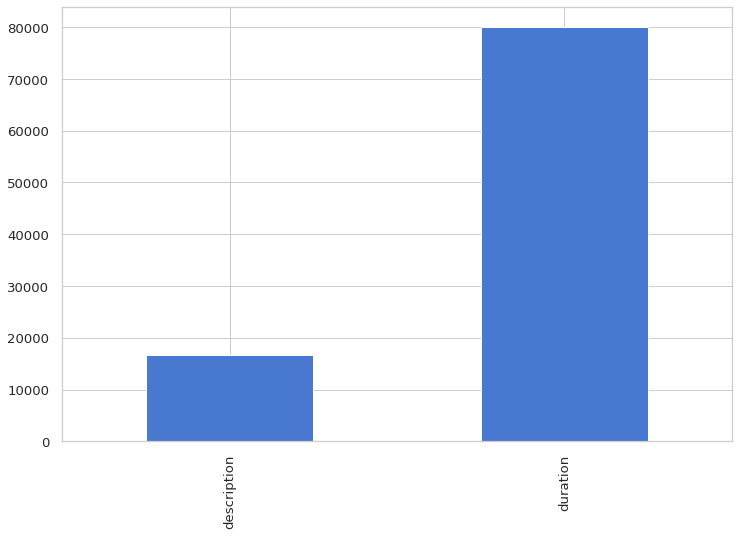

In [13]:
def missing_value_describe(data):
    # check missing values in the data
    total = data.isna().sum().sort_values(ascending=False)
    missing_value_pct_stats = (data.isnull().sum() / len(data)*100)
    missing_value_col_count = sum(missing_value_pct_stats > 0)

    # missing_value_stats = missing_value_pct_stats.sort_values(ascending=False)[:missing_value_col_count]
    missing_data = pd.concat([total, missing_value_pct_stats], axis=1, keys=['Total', 'Percentage(%)'])

    print("Number of rows with at least 1 missing values:", data.isna().any(axis = 1).sum())
    print("Number of columns with missing values:", missing_value_col_count)

    if missing_value_col_count != 0:
        # print out column names with missing value percentage
        print("\nMissing percentage (desceding):")
        display(missing_data[:missing_value_col_count])

        # plot missing values
        missing = data.isnull().sum()
        missing = missing[missing > 0]
        missing.sort_values(inplace=True)
        missing.plot.bar()
    else:
        print("No missing data!!!")

# pass a dataframe to the function
missing_value_describe(pulse_point_df)

<a id='4'></a>
# 4 Data Cleaning

## Discard Columns

In [14]:
pulse_point_df.drop(['id', 'incident_logo', 'agency_logo'], axis=1, inplace=True)

## Remove Active Incidents

Because active incidents are the noisy duplicated data of the “**recent type incident**” which was unable to remove during the data collection process. Thus, it does not contribute to the analysis. 

In [15]:
pulse_point_df.type.value_counts()

recent    281278
active     79967
Name: type, dtype: int64

In [16]:
pulse_point_df.drop(pulse_point_df[pulse_point_df.type == 'active'].index, inplace=True)
pulse_point_df.reset_index(drop=True, inplace=True)

Drop redundant column **"type"**

In [17]:
pulse_point_df.drop(columns=['type'], axis=1, inplace=True)

<a id='5'></a>
# 5 Feature Extraction

<a id='5.1'></a>
## 5.1 Location

In [18]:
pulse_point_df.location

0            2210 E WASHINGTON ST, SUFFOLK, VA
1                        2300 A ST, TACOMA, WA
2                4601 NW 30TH TER, TAMARAC, FL
3                4611 NW 30TH TER, TAMARAC, FL
4              PUYALLUP AVE & A ST, TACOMA, WA
                          ...                 
281273             1252 WILROY RD, SUFFOLK, VA
281274        913 E WASHINGTON ST, SUFFOLK, VA
281275    717 OCEAN BREEZE WK, OCEAN BEACH, NY
281276       S 8TH ST & YAKIMA AVE, TACOMA, WA
281277     S 92ND ST & S HOSMER ST, TACOMA, WA
Name: location, Length: 281278, dtype: object

In [19]:
pulse_point_df.location.value_counts().head(10)

COLLINS AVE, MIAMI BEACH, FL                                    99
N HARBOR BL, FULLERTON, CA                                      79
175 NE 1ST ST, MCMINNVILLE, OR (MCMINNVILLE FIRE DEPARTMENT)    78
WASHINGTON AVE, MIAMI BEACH, FL                                 77
FREMONT BLVD, FREMONT, CA                                       76
ALTON RD, MIAMI BEACH, FL                                       70
PRESTON RD, FRISCO, TX                                          70
LEGACY DR, FRISCO, TX                                           66
E STATE ST, ROCKFORD, IL                                        65
STONEBROOK PKWY, FRISCO, TX                                     64
Name: location, dtype: int64

### Insights and Feature Extraction

There are many variations in the **location** column:

Such as - 
* NE OAK SPRINGS FARM RD, CARLTON, OR
* W 10TH ST, LONG BEACH, CA
* 302 E OJAI AVE, OJAI, CA (OJAI ARCADE (21002302))
* 175 NE 1ST ST, MCMINNVILLE, OR (MCMINNVILLE FIRE DEPARTMENT)
* E BARNETT RD, MEDFORD, OR

We can split the locations into multiple features -  

>### State
Text after the last comma appears to be the short form of US states or Canadian provinces.

**CA** -> California state

**OR** -> Oregon state

>### City
Text after second last comma appears to be city name (or town, county name)

**MEDFORD** is a city in Oregon (last example - "E BARNETT RD, MEDFORD, OR")

>### Address
Apart from state and city name, the rest will be counted as address features if there are three comma-separated elements (texts)

>### Address_2
Apart from state, city, and address the rest will be counted as extended address (**address_2**) feature if there are four comma-separated element/string 

>### Business 
Bracket enclosed string will be counted as **Business Name**. 

From the above example - **OJAI ARCADE (21002302)** and **MCMINNVILLE FIRE DEPARTMENT** are counted as **business feature**

### Business Place Extractor

In [20]:
def get_business_name(location):
    # https://stackoverflow.com/a/38212061/11105356
    stack = 0
    start_index = None
    results = []

    for i, c in enumerate(location):
        if c == '(':
            if stack == 0:
                start_index = i + 1  # string to extract starts one index later

            # push to stack
            stack += 1
        elif c == ')':
            # pop stack
            stack -= 1

            if stack == 0:
                results.append(location[start_index:i])
    try:
      if len(results) == 0:
        return None
      elif len(results) == 1 and len(results[0]) == 1:
        return None
      elif len(results) == 1 and len(results[0])!=1:
        return results[0].strip()
      elif len(results) > 1 and len(results[0])==1:
        return None
      else:
        return results[1].strip()
    except IndexError as ie:
      pass

### handles variations such as -
# 5709 RICHMOND RD, STE 76, JAMES CITY COUNTY, VA (JANIE & JACK)
# 433 SARATOGA RD, SCHENECTADY, NY ((GLENVILLE)EAST GLENVILLE FD)
# I 229 RAMP  & I 229 RAMP (0.1 MILES), SIOUX FALLS, SD (I 229 MM 8 NB)
# 6501 MISTY WATERS DR, STE (S)E260 (N), BURLEIGH COUNTY, ND

### Split Location

>**Example 1 (3 elements)**: **`302 E OJAI AVE, OJAI, CA (OJAI ARCADE (21002302))`** 
>
> address = **`302 E OJAI AVE`**, city = **`OJAI`**, state = **`CA`**, business = **`OJAI ARCADE (21002302)`**

>**Example 2 (4 elements)**: **`GRASSIE BLVD, STE 212, WINNIPEG, MANITOBA`** 
>
> address = **`GRASSIE BLVD`**, address_2 = **`STE 212`**, city = **`WINNIPEG`**, state = **`MANITOBA`** (wil be converted to `MB` later)

In [21]:
# examples
# 302 E OJAI AVE, OJAI, CA (OJAI ARCADE (21002302)) --- 3 segments with business inside
# 1959 MORSE RD, COLUMBUS, OH (DOLLAR GENERAL)
# I 229 RAMP  & I 229 RAMP (0.1 MILES), SIOUX FALLS, SD (I 229 MM 8 NB)
# GRASSIE BLVD, STE 212, WINNIPEG, MANITOBA --- 4 segments



# split location into 3 or 4 parts depending on number of commas -> 
# 3 segments : address, city, state
# 4 segments : address, address_2, city, state


# to extract bracket enclosed string 
pulse_point_df['business'] = pulse_point_df.location.apply(lambda x : get_business_name(x))

### remove enclosed business name from the location string
pulse_point_location_data = pulse_point_df.apply(lambda row : row['location'].replace(str(row['business']), ''), axis=1)

# remove leftover bracket from the business replacemnt
# https://stackoverflow.com/a/49183590/11105356
# remove a (...) substring with a leading whitespace at the end of the string only
pulse_point_location_data = pulse_point_location_data.str.replace(r"\s*\([^()]*\)$","").str.strip()


# split the location
four_col_location_split = ['address', 'address_2', 'city','state']
three_col_location_split = ['address', 'city','state']


# four col indices
# pulse_point_location_data[pulse_point_location_data.str.split(',', expand=True)[3].notna()]

extra_loc_data = pulse_point_location_data.str.split(',', expand=True) # to expand columns
four_col_indices = extra_loc_data[extra_loc_data.apply(lambda x: np.all(pd.notnull(x[3])) , axis = 1)].index
four_col_loc_df = extra_loc_data.iloc[four_col_indices]
four_col_loc_df.columns = four_col_location_split
four_col_loc_df

,address,address_2,city,state
41,150 JOHNSON AVE,STE 14,CAPE CANAVERAL,FL
43,1262 PRAIRIE LN,STE 305,TITUSVILLE,FL
54,6431 N 84TH ST,STE 4,MILWAUKEE,WI
64,405 S BLAINE ST,STE 5,NEWBERG,OR
65,18390 SW BOONES FERRY RD,STE F207,TIGARD,OR
...,...,...,...,...
281244,4515 86TH ST,STE 35,URBANDALE,IA
281253,223 E BAKERVIEW RD,STE 348,BELLINGHAM,WA
281254,1129 11TH ST,STE 304,WEST DES MOINES,IA
281256,1245 SE UNIVERSITY AVE,STE 103,WAUKEE,IA


### Four Features

In [22]:
pulse_point_df.loc[four_col_loc_df.index , four_col_location_split] = four_col_loc_df
pulse_point_df[four_col_location_split] = pulse_point_df[four_col_location_split].apply(lambda x: x.str.strip())
pulse_point_df[four_col_location_split]

# there are very few numbers of four feature location than three feature location

,address,address_2,city,state
0,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN
...,...,...,...,...
281273,NaN,NaN,NaN,NaN
281274,NaN,NaN,NaN,NaN
281275,NaN,NaN,NaN,NaN
281276,NaN,NaN,NaN,NaN


### Three Features

In [23]:
four_col_loc_df_mask = extra_loc_data.index.isin(four_col_indices)
three_col_loc_df = extra_loc_data[~four_col_loc_df_mask].drop([3], axis=1)
three_col_loc_df.columns = three_col_location_split

# extra_loc_data[~three_col_loc_df][3].notna().sum() # to check null values

three_col_loc_df

,address,city,state
0,2210 E WASHINGTON ST,SUFFOLK,VA
1,2300 A ST,TACOMA,WA
2,4601 NW 30TH TER,TAMARAC,FL
3,4611 NW 30TH TER,TAMARAC,FL
4,PUYALLUP AVE & A ST,TACOMA,WA
...,...,...,...
281273,1252 WILROY RD,SUFFOLK,VA
281274,913 E WASHINGTON ST,SUFFOLK,VA
281275,717 OCEAN BREEZE WK,OCEAN BEACH,NY
281276,S 8TH ST & YAKIMA AVE,TACOMA,WA


In [24]:
pulse_point_df.loc[three_col_loc_df.index , three_col_location_split] = three_col_loc_df
pulse_point_df[three_col_location_split] = pulse_point_df[three_col_location_split].apply(lambda x: x.str.strip())
pulse_point_df[three_col_location_split]

,address,city,state
0,2210 E WASHINGTON ST,SUFFOLK,VA
1,2300 A ST,TACOMA,WA
2,4601 NW 30TH TER,TAMARAC,FL
3,4611 NW 30TH TER,TAMARAC,FL
4,PUYALLUP AVE & A ST,TACOMA,WA
...,...,...,...
281273,1252 WILROY RD,SUFFOLK,VA
281274,913 E WASHINGTON ST,SUFFOLK,VA
281275,717 OCEAN BREEZE WK,OCEAN BEACH,NY
281276,S 8TH ST & YAKIMA AVE,TACOMA,WA


### Final Merging of Location Features

In [25]:
pulse_point_df[['location','address', 'address_2', 'city','state', 'business']]

,location,address,address_2,city,state,business
0,"2210 E WASHINGTON ST, SUFFOLK, VA",2210 E WASHINGTON ST,NaN,SUFFOLK,VA,None
1,"2300 A ST, TACOMA, WA",2300 A ST,NaN,TACOMA,WA,None
2,"4601 NW 30TH TER, TAMARAC, FL",4601 NW 30TH TER,NaN,TAMARAC,FL,None
3,"4611 NW 30TH TER, TAMARAC, FL",4611 NW 30TH TER,NaN,TAMARAC,FL,None
4,"PUYALLUP AVE & A ST, TACOMA, WA",PUYALLUP AVE & A ST,NaN,TACOMA,WA,None
...,...,...,...,...,...,...
281273,"1252 WILROY RD, SUFFOLK, VA",1252 WILROY RD,NaN,SUFFOLK,VA,None
281274,"913 E WASHINGTON ST, SUFFOLK, VA",913 E WASHINGTON ST,NaN,SUFFOLK,VA,None
281275,"717 OCEAN BREEZE WK, OCEAN BEACH, NY",717 OCEAN BREEZE WK,NaN,OCEAN BEACH,NY,None
281276,"S 8TH ST & YAKIMA AVE, TACOMA, WA",S 8TH ST & YAKIMA AVE,NaN,TACOMA,WA,None


Number of rows with at least 1 missing values: 280163
Number of columns with missing values: 2

Missing percentage (desceding):


,Total,Percentage(%)
address_2,272246,96.788942
business,266152,94.622402


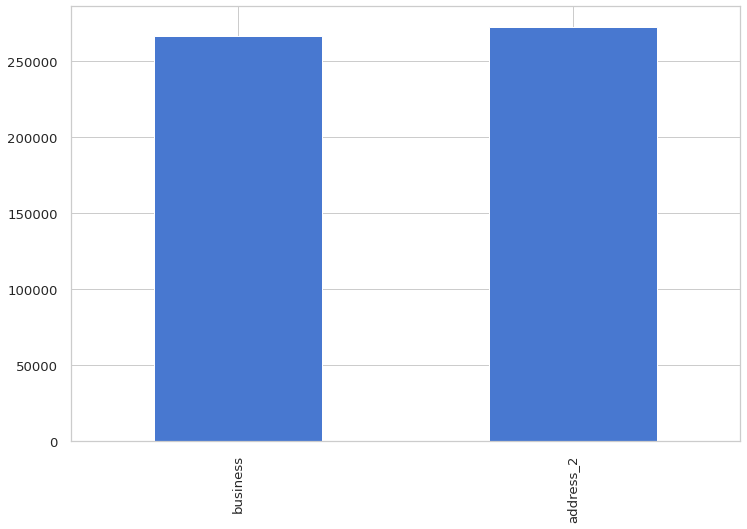

In [26]:
missing_value_describe(pulse_point_df[['location','address', 'address_2', 'city','state', 'business']])

### Drop Garbage

In [27]:
pulse_point_df[pulse_point_df.city.isna()]

,title,agency,location,timestamp_time,date_of_incident,description,duration,business,address,address_2,city,state


In [28]:
pulse_point_df = pulse_point_df[pulse_point_df.city.notna()]

<a id='5.2'></a>
## 5.2 City

In [29]:
mask = ((pulse_point_df.city.isna()) | (pulse_point_df.city==u'') )

display(pulse_point_df[mask])

,title,agency,location,timestamp_time,date_of_incident,description,duration,business,address,address_2,city,state
38923,Mutual Aid,Sumter Fire & EMS,"34498 CORTEZ BLVD, BLDG NOT FOUND, RIDGE MANOR, FL (RIDGE MANOR)",11:53 PM,2021-07-03,NaN,4 m,RIDGE MANOR,34498 CORTEZ BLVD,BLDG NOT FOUND,,FL
50888,Mutual Aid,San Ramon Valley FPD,"3590 CLAYTON RD, CONCORD, CA (CONCORD)",10:15 PM,2021-07-12,PM32,52 m,CONCORD,3590 CLAYTON RD,NaN,,CA
272125,Traffic Collision,Idaho Falls Fire,"UNKNOWN & W 137TH S, S 5TH W, SHELLEY, ID (SHELLEY)",12:53 AM,2021-12-28,AB5,9 m,SHELLEY,UNKNOWN & W 137TH S,S 5TH W,,ID


**The business names are same as the city names**. I first removed the text containing business names and then performed text extraction for cities. That's why city names are blank for the cases like these.  

Let's replace their city names with business names.

In [30]:
pulse_point_df.loc[mask,'city'] = pulse_point_df[mask].business

<a id='5.3'></a>
## 5.3 State

In [31]:
display(pulse_point_df.state.value_counts())
printmd(f"**Total {len(pulse_point_df.state.value_counts().index)} States. Some of them are Canadian provinces,  ex - MANITOBA**")

CA                                        85135
FL                                        26543
WA                                        17828
VA                                        17754
OH                                        17079
OR                                        15827
WI                                         9808
MO                                         9521
TX                                         8451
IL                                         5783
PA                                         5172
IN                                         4960
KS                                         4647
NV                                         4574
MN                                         3865
NC                                         3759
AZ                                         3642
TN                                         3624
DE                                         2861
OK                                         2849
MANITOBA                                

**Total 47 States. Some of them are Canadian provinces,  ex - MANITOBA**

### Canadian Province

#### Mapping Canadian provinces to their unique short form


In [32]:
# Canadian Province Mapping
# https://www150.statcan.gc.ca/n1/pub/92-195-x/2011001/geo/prov/tbl/tbl8-eng.htm
# https://en.wikipedia.org/wiki/Provinces_and_territories_of_Canada

ca_province_dic = {
    'Newfoundland and Labrador': 'NL',
    'Prince Edward Island': 'PE',
    'Nova Scotia': 'NS',
    'New Brunswick': 'NB',
    'Quebec': 'QC',
    'Ontario': 'ON',
    'Manitoba': 'MB',
    'Saskatchewan': 'SK',
    'Alberta': 'AB',
    'British Columbia': 'BC',
    'Yukon': 'YT',
    'Northwest Territories': 'NT',
    'Nunavut': 'NU',
}

# approach 1

# def handle_state(data_attr):
#   for k, v in canada_provinces_dic.items():
#       if data_attr.strip().lower() == k.lower():
#         return canada_provinces_dic[k]
#   else:
#     return data_attr

# pulse_point_df['state'] =  pulse_point_df.state.apply(handle_state)


# approach 2

# https://stackoverflow.com/a/69994272/11105356

ca_province_dict = {k.lower():v for k,v in ca_province_dic.items()}
pulse_point_df['state']  = pulse_point_df['state'].str.lower().map(ca_province_dict).fillna(pulse_point_df.state)

### Noise Removal

In [33]:
# Exception state : example - 'FL  #1005' , 'NY EAST GLENVILLE FD', ' DE / RM304'

mask = pulse_point_df.state.apply(lambda x:len(x)>2)
display(pulse_point_df[mask].state)

25695    MO (NUSACH HARI BNAI ZION CONGREGATION
50895                                   CONCORD
78626                                    NV ())
Name: state, dtype: object

**Keeping only the first segment which is the short form for city, discarding the rest(noise)**

In [34]:
pulse_point_df.loc[mask,'state'] = pulse_point_df[mask].state.apply(lambda x: x.split()[0])

In [35]:
pulse_point_df.state.value_counts()

CA         85135
FL         26543
WA         17828
VA         17754
OH         17079
OR         15827
WI          9808
MO          9522
TX          8451
IL          5783
PA          5172
IN          4960
KS          4647
NV          4575
MN          3865
NC          3759
AZ          3642
TN          3624
DE          2861
OK          2849
MB          2730
MD          2658
ND          2569
NY          2228
CO          1815
DC          1788
NE          1721
NJ          1663
ID          1505
SD          1372
AK          1271
GA          1192
KY           908
UT           816
HI           808
AR           797
SC           778
NM           396
MI           277
IA           201
AL            58
LA            21
ON            15
BC             6
CONCORD        1
Name: state, dtype: int64

### Leftover

In [36]:
# CONCORD
mask = pulse_point_df.state.str.startswith('CONCORD')

display(pulse_point_df[mask])
printmd("**CONCORD should be in CA**")

,title,agency,location,timestamp_time,date_of_incident,description,duration,business,address,address_2,city,state
50895,Mutual Aid,San Ramon Valley FPD,"2020 GRANT ST, STE 1205, CONCORD",9:51 PM,2021-07-12,PM32,20 m,None,2020 GRANT ST,NaN,STE 1205,CONCORD


**CONCORD should be in CA**

In [37]:
pulse_point_df.loc[mask,'state'] = 'CA'

In [38]:
pulse_point_df.state.value_counts()

CA    85136
FL    26543
WA    17828
VA    17754
OH    17079
OR    15827
WI     9808
MO     9522
TX     8451
IL     5783
PA     5172
IN     4960
KS     4647
NV     4575
MN     3865
NC     3759
AZ     3642
TN     3624
DE     2861
OK     2849
MB     2730
MD     2658
ND     2569
NY     2228
CO     1815
DC     1788
NE     1721
NJ     1663
ID     1505
SD     1372
AK     1271
GA     1192
KY      908
UT      816
HI      808
AR      797
SC      778
NM      396
MI      277
IA      201
AL       58
LA       21
ON       15
BC        6
Name: state, dtype: int64

<a id='5.4'></a>
## 5.4  Time

#### Converting time string to seconds

**For example - "1 h 34 m" will be 94*60 = 5640 seconds**

In [39]:
#https://stackoverflow.com/a/57846984/11105356

UNITS = {'s':'seconds', 'm':'minutes', 'h':'hours', 'd':'days', 'w':'weeks'}

# chance of having days and weeks is none 

def convert_to_seconds(s):
    s = s.replace(" ","")
    return int(timedelta(**{
        UNITS.get(m.group('unit').lower(), 'seconds'): int(m.group('val'))
        for m in re.finditer(r'(?P<val>\d+)(?P<unit>[smhdw]?)', s, flags=re.I)
    }).total_seconds())

# convert_to_seconds("1 h 34 m")

### Duration (seconds)

#### Extract duration total time from “duration” text

In [40]:
pulse_point_df["duration_in_seconds"] = pulse_point_df.duration.apply(lambda x:convert_to_seconds(x))

### Adding Extra Time Related Features

In [41]:
pulse_point_df["day_name"], pulse_point_df["weekday"] = pulse_point_df.date_of_incident.dt.day_name(), pulse_point_df.date_of_incident.dt.weekday

pulse_point_df["month_name"] = pulse_point_df.date_of_incident.dt.month_name()


## more features

# pulse_point_df.date_of_incident.dt.month_name()
# pulse_point_df.date_of_incident.dt.month

# pulse_point_df.date_of_incident.dt.day
# pulse_point_df.date_of_incident.dt.day_name()

# pulse_point_df.date_of_incident.dt.weekday
# pulse_point_df.date_of_incident.dt.isocalendar().week

In [42]:
pulse_point_df.tail(40)

,title,agency,location,timestamp_time,date_of_incident,description,duration,business,address,address_2,city,state,duration_in_seconds,day_name,weekday,month_name
281238,Refuse/Garbage Fire,Huntington Beach FD,"21661 BROOKHURST ST, HUNTINGTON BEACH, CA",12:32 AM,2021-05-03,ME83,19 m,None,21661 BROOKHURST ST,NaN,HUNTINGTON BEACH,CA,1140,Monday,0,May
281239,Residential Fire,Whatcom Fire/EMS,"3037 PACIFIC ST, BELLINGHAM, WA",3:30 AM,2021-05-03,NaN,59 m,None,3037 PACIFIC ST,NaN,BELLINGHAM,WA,3540,Monday,0,May
281240,Mutual Aid,West Sacramento Fire,"1700 CAPITAL AVE, SAC, WEST SACRAMENTO, CA",2:16 AM,2021-05-03,E43 WSAID,3 m,None,1700 CAPITAL AVE,SAC,WEST SACRAMENTO,CA,180,Monday,0,May
281241,Mutual Aid,WestShore FDs,"25157 CARLTON PARK, STE 120, NORTH OLMSTED, OH",2:13 AM,2021-05-03,FVM31,54 m,None,25157 CARLTON PARK,STE 120,NORTH OLMSTED,OH,3240,Monday,0,May
281242,Mutual Aid,West Sacramento Fire,"106 J ST, SACRAMENTO, CA (SPIRITS RESTAURANT)",2:13 AM,2021-05-03,B44 E44 WSAID,17 m,SPIRITS RESTAURANT,106 J ST,NaN,SACRAMENTO,CA,1020,Monday,0,May
281243,Mutual Aid,West Sacramento Fire,"1210 FRONT ST, SACRAMENTO, CA (RIO CITY CAFE)",2:10 AM,2021-05-03,BT41 WSAID,46 m,RIO CITY CAFE,1210 FRONT ST,NaN,SACRAMENTO,CA,2760,Monday,0,May
281244,Structure Fire,Westcom,"4515 86TH ST, STE 35, URBANDALE, IA",1:13 AM,2021-05-03,A213 A323 A433 C300 C404 E411 E431 JGMENG2 L325 L425,28 m,None,4515 86TH ST,STE 35,URBANDALE,IA,1680,Monday,0,May
281245,Refuse/Garbage Fire,Wicomico County,"317 WHITMAN AVE, SALISBURY, MD",12:57 AM,2021-05-03,TR2,16 m,None,317 WHITMAN AVE,NaN,SALISBURY,MD,960,Monday,0,May
281246,Residential Fire,West Palm Beach Fire,"436 51ST ST, WEST PALM BEACH, FL",12:37 AM,2021-05-03,BC1 BC5 E1 E4 EMS2 FOO HM2 L6 PI11 R1 R3 SQ5 TAC8A TR1 WPIV WPIV2,1 h 30 m,None,436 51ST ST,NaN,WEST PALM BEACH,FL,5400,Monday,0,May
281247,Appliance Fire,Wicomico County,"1149 S DIVISION ST, SALISBURY, MD",8:55 PM,2021-05-02,AC1 E1 TR2,12 m,None,1149 S DIVISION ST,NaN,SALISBURY,MD,720,Sunday,6,May


### Time of the day

I will assign **Daytime** values based on the **time range** below - 

| Time of the Day | Range |
| ----------- | ----------- |
| Morning | 5 AM to 11:59 AM|
| Afternoon | 12PM to 4:59 PM |
| Evening | 5 PM to 8:59 PM|
| Night | 9 PM to 11:59 PM |
| Midnight | 12 AM to 4:59 AM|

In [43]:
# https://stackoverflow.com/a/70018607/11105356

def time_range(time):
  hour = datetime.strptime(time, '%I:%M %p').hour
  if hour > 20:
      return "Night"
  elif hour > 16:
      return "Evening"
  elif hour > 11:
      return "Afternoon"
  elif hour > 4:
      return "Morning"
  else:
      return "Midnight"

In [44]:
pulse_point_df["time_of_the_day"] = pulse_point_df.timestamp_time.apply(lambda time: time_range(time))

# # pulse_point_df.timestamp_time = pd.to_datetime(pulse_point_df.timestamp_time).dt.time

## Save Cleaned and Processed  Dataset

In [45]:
pulse_point_df.to_csv('PulsePoint-emergencies-cleaned.csv', index=False)

<a id='6'></a>
# 6 EDA

A quick overview of the preprocessed data- 

The preprocessed dataset contains additional  5 columns extracted from the **location** column, another 5 columns extracted from **date\_of\_incident** and **duration** columns. **Id** , **Incident\_logo** and  **agency\_logo** columns from the original dataset was discarded.

| **Columns**        | **Description**                           | **Data Type**  |
| ------------------ | ----------------------------------------- | -------------- |
| business   | Name of the business place extracted from location(e.g., JANIE & JACK, DOLLAR GENERAL etc.)                      | object|
| address | Address where the incident took place (extracted from location)         | object         |
| address\_2              | Extended address where the incident took place (extracted from location)              | object         |
| city | City where the incident took place (extracted from location). It could also be a town or a country   | object         |
| state    | State where the incident took place (extracted from location) | object         |
| duration\_in\_seconds | Incident duration in seconds (extracted from duration)     | numeric, int|
| day\_name | Name of the day when the incident took place       | object        |
| weekday | The day of the week with Monday=0, Sunday=6.                | object         |
| month_name     | Name of the month (extracted from date)                     | object         |
| time\_of\_the_day  | morning (5AM-11:59AM),  afternoon (12PM-4:59 PM),  evening (5PM-8:59PM),  night (9PM-11:59PM), midnight (12AM-4:59AM)| object |

In [46]:
printmd(f"There are total **{pulse_point_df.shape[0]}** incidents")

There are total **281278** incidents

In [47]:
pulse_point_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 281278 entries, 0 to 281277
Data columns (total 17 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   title                281278 non-null  object        
 1   agency               281278 non-null  object        
 2   location             281278 non-null  object        
 3   timestamp_time       281278 non-null  object        
 4   date_of_incident     281278 non-null  datetime64[ns]
 5   description          267894 non-null  object        
 6   duration             281278 non-null  object        
 7   business             15126 non-null   object        
 8   address              281278 non-null  object        
 9   address_2            9032 non-null    object        
 10  city                 281278 non-null  object        
 11  state                281278 non-null  object        
 12  duration_in_seconds  281278 non-null  int64         
 13  day_name      

In [48]:
pulse_point_df.describe().T

,count,mean,std,min,25%,50%,75%,max
duration_in_seconds,281278.0,2578.742312,2878.920631,0.0,1020.0,1860.0,3480.0,116760.0
weekday,281278.0,3.076256,2.012422,0.0,1.0,3.0,5.0,6.0


In [49]:
pulse_point_df.describe(include='object').T

,count,unique,top,freq
title,281278,88,Medical Emergency,179753
agency,281278,773,Montgomery County,6296
location,281278,179763,"COLLINS AVE, MIAMI BEACH, FL",99
timestamp_time,281278,1440,5:04 AM,333
description,267894,85203,E1,1249
duration,281278,728,16 m,6420
business,15126,11244,UNINC,83
address,281278,155622,MAIN ST,462
address_2,9032,2758,STE BLK,266
city,281278,3530,LOS ANGELES,8017


Number of rows with at least 1 missing values: 280200
Number of columns with missing values: 3

Missing percentage (desceding):


,Total,Percentage(%)
address_2,272246,96.788942
business,266152,94.622402
description,13384,4.758282


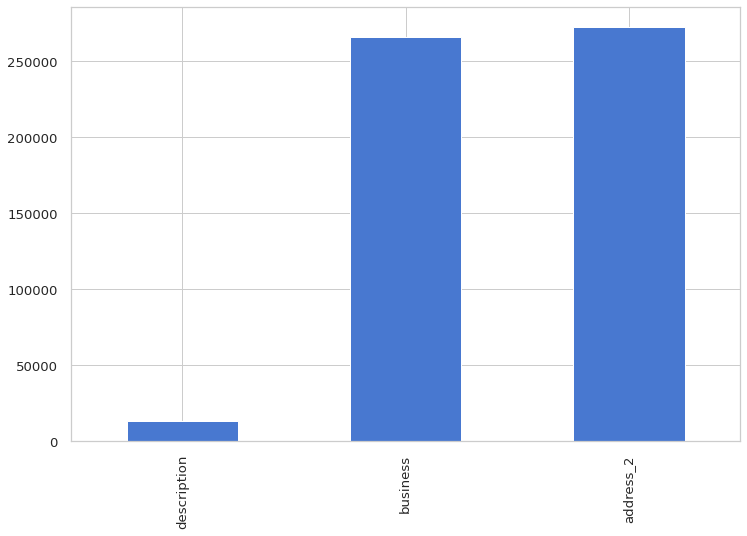

In [50]:
missing_value_describe(pulse_point_df)

<a id='6.1'></a>
## 6.1 Incidents

In [51]:
printmd(f"There are total **{len(pulse_point_df.title.unique())}** types of incidents")

There are total **88** types of incidents

### Top 

In [52]:
pulse_point_df.title.value_counts().head(20)

Medical Emergency             179753
Traffic Collision              22835
Fire Alarm                     11147
Alarm                           7420
Public Service                  7363
Refuse/Garbage Fire             4437
Structure Fire                  4152
Lift Assist                     3130
Mutual Aid                      2862
Fire                            2723
Residential Fire                2559
Expanded Traffic Collision      2527
Interfacility Transfer          2014
Outside Fire                    1963
Vehicle Fire                    1810
Investigation                   1628
Carbon Monoxide                 1513
Vegetation Fire                 1428
Hazardous Condition             1423
Commercial Fire                 1405
Name: title, dtype: int64

### Wordcloud

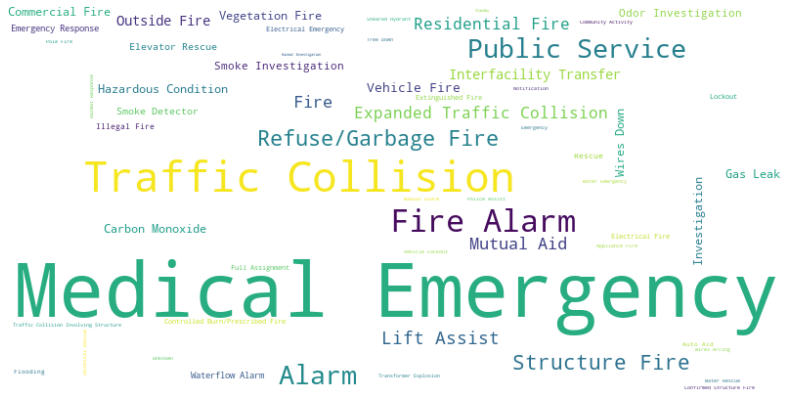

In [53]:
# crisp wordcloud : https://stackoverflow.com/a/28795577/11105356

data = pulse_point_df.title.value_counts().to_dict()
wc = WordCloud(width=800, height=400,background_color="white", max_font_size=300).generate_from_frequencies(data)
plt.figure(figsize=(14,10))
plt.imshow(wc, interpolation="bilinear")
plt.axis('off')
plt.show()

<a id='6.2'></a>
## 6.2 Agency

In [54]:
printmd(f"There are total **{len(pulse_point_df.agency.unique())}** agencies")

There are total **773** agencies

### Most Active 

In [55]:
# Top agencies by incident engagement count

pulse_point_df.agency.value_counts().head(20)

Montgomery County       6296
Columbus Fire           4957
Milwaukee Fire          4793
Cleveland EMS           4728
Contra Costa FPD        4609
Fairfax County Fire     3547
Hamilton County         3473
Eug Spfld Fire          3302
Boone County Joint      3143
LAFD - Central          3136
Rockford Fire           3052
LA County FD (Div 4)    2992
LA County FD (Div 8)    2990
LA County FD (Div 6)    2964
LA County FD (Div 1)    2925
Seminole County Fire    2909
LA County FD (Div 2)    2900
LA County FD (Div 5)    2864
Seattle FD              2858
Miami Beach Fire        2802
Name: agency, dtype: int64

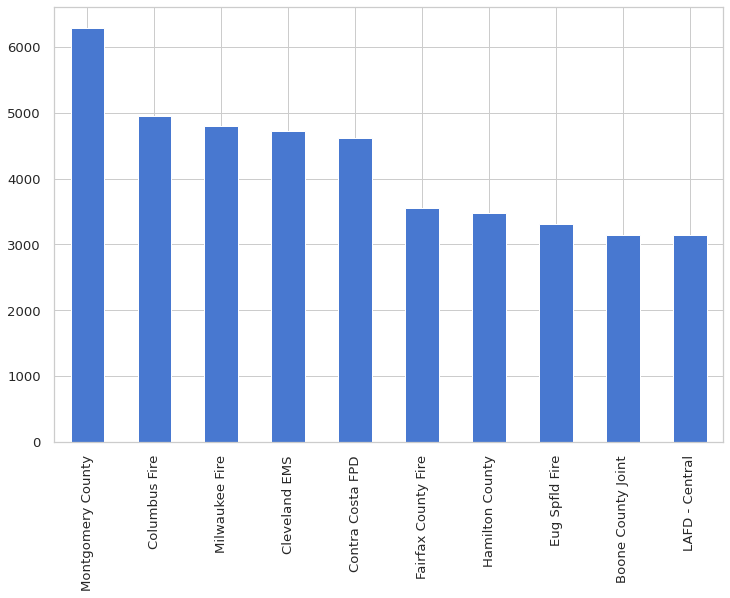

In [56]:
pulse_point_df.agency.value_counts().head(10).sort_values(ascending=False).plot(kind = 'bar');

### Wordcloud

Most frequent - **Montgomery County**

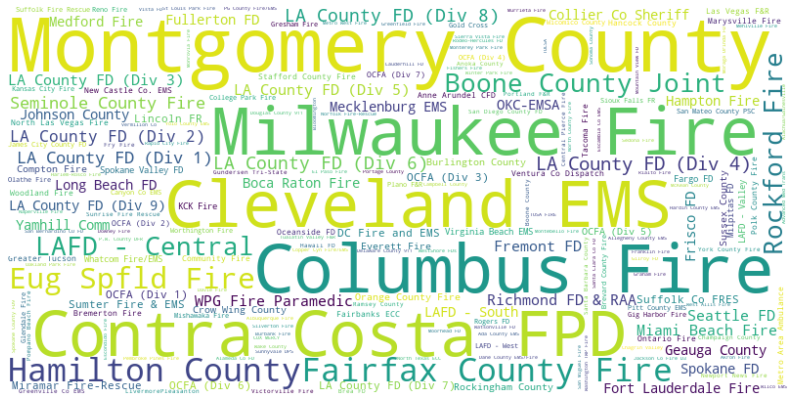

In [57]:
data = pulse_point_df.agency.value_counts().to_dict()
wc = WordCloud(width=800, height=400,background_color="white", max_font_size=300).generate_from_frequencies(data)
plt.figure(figsize=(14,10))
plt.imshow(wc, interpolation="bilinear")
plt.axis('off')
plt.show()

<a id='6.3'></a>
## 6.3 Description (Codes)

The codes themselves are defined by each agency, and are typically followed by a number to identify a particular instance of each asset type. A legend is sometimes provided on the agency information page, and following are some common examples:

* B=Battalion 
* BC=Battalion 
* Chief E=Engine 
* CMD=Command 
* CPT=Helicopter 
* C=Crew 
* DZR=Dozer 
* HM=Hazmat 
* ME=Medic Engine 
* MRE=Medic Rescue Engine 
* P=Patrol 
* R=Rescue 
* RE=Rescue Engine 
* SQ=Squad 
* T=Truck 
* U=Utility 
* WT=Water Tender 

Credit: [PulsePoint Wikipedia](https://en.wikipedia.org/wiki/PulsePoint#Incident_Responder_Unit_Codes)

*Note: There is no standard for the identifier abbreviations (E, T, S, BC, RA, PM, etc.), and they can vary significantly from agency to agency.*

Example - [Ventura County Fire Department PulsePoint  Unit  Abbreviations PDF](https://vcfd.org/wp-content/uploads/2020/07/PulsePoint_Unit_Abbreviations.pdf)

To know more, visit - [https://www.pulsepoint.org/unit-status-legend](https://www.pulsepoint.org/unit-status-legend)

In [58]:
pulse_point_df.description.value_counts().head(10)

E1     1249
E2     1056
E4      743
E3      701
E6      699
E11     671
M1      636
E14     610
E10     601
E51     564
Name: description, dtype: int64

Checking for **`MRE`(Medic Rescue Engine)** code in description

In [59]:
mask = pulse_point_df.description.str.contains('MRE', regex=False, na=False)
display(pulse_point_df.description[mask])
printmd(f"**{pulse_point_df.description[mask].count()}** instances contain **MRE** code")

565       B5 DMRE238 E24 E47 M9 RSFB261 SOLE237 SOLT237
1903         B14 B15 E132 ME32 ME33 ME35 ME52 MRE31 T35
3637          B19 B29 E132 ME34 ME36 ME37 MRE31 Q44 T35
3669          MRB4 MRE3 MRF6 MRFD1 MRR76 MRS5 MRT7 MRT8
4087                           B17 ME21 ME23 ME26 SMRE4
                              ...                      
264925                    B18 ME21 ME23 ME26 SMRE4 WT26
276683            A14 B1 B2 E15 E6 EMS1 H14 M2 MRED T12
280991                                    B14 E22 MRE23
281020    B14 B2 E22 IV12 ME1 ME20 ME21 MRE23 MT5 VNCIV
281088                                       E132 MRE31
Name: description, Length: 93, dtype: object

**93** instances contain **MRE** code

<a id='6.4'></a>
## 6.4 Duration

In [60]:
(pulse_point_df.duration_in_seconds/ 60).value_counts().head(30)

# alternative
# pulse_point_df.duration.value_counts().head(20)

16.0    6420
18.0    6334
15.0    6332
17.0    6330
14.0    6202
19.0    6192
20.0    6025
21.0    5908
13.0    5907
12.0    5664
22.0    5530
11.0    5360
23.0    5195
10.0    5076
24.0    4877
9.0     4582
25.0    4535
26.0    4308
27.0    4018
8.0     3832
28.0    3652
29.0    3541
30.0    3425
7.0     3409
31.0    3174
4.0     3060
32.0    3044
5.0     2977
33.0    2925
3.0     2911
Name: duration_in_seconds, dtype: int64

**Most of the emergency engagement lasted under 30 mins**

<a id='6.5'></a>
## 6.5 Incident Location

### City

In [61]:
printmd(f"There are total **{len(pulse_point_df.city.unique())}** cities PulsePoint covered")

There are total **3530** cities PulsePoint covered

In [62]:
pulse_point_city_df = pulse_point_df.groupby(['city','state'], as_index=False).count()[['city', 'state', 'title']].reset_index(drop=True).rename(columns={'title':'count'})
pulse_point_city_df.head(50)

,city,state,count
0,*,NM,3
1,**UNDEFINED,CA,17
2,-105.124526,CO,1
3,0304,NJ,5
4,0306,NJ,4
5,0308,NJ,1
6,0310,NJ,3
7,0311,NJ,2
8,0312,NJ,3
9,0313,NJ,7


**Some cities in different states have the same name**

In [63]:
pulse_point_city_df[pulse_point_city_df.city.str.lower() == 'bloomington']

,city,state,count
330,BLOOMINGTON,CA,9
331,BLOOMINGTON,IN,410


Outliers in city names - **`*`** , **'0324'**, **' **UNDEFINED'**, **'12809 - NAME?'** etc.

In [64]:
pulse_point_df[pulse_point_df.city.str.startswith('0324')].head()

,title,agency,location,timestamp_time,date_of_incident,description,duration,business,address,address_2,city,state,duration_in_seconds,day_name,weekday,month_name,time_of_the_day
63653,Fire Alarm,Burlington County,"6407 NORMANDY DR, 0324, NJ",4:54 AM,2021-07-26,F3603 F361 F363 F3631 F3632 F3635 P36115,12 m,None,6407 NORMANDY DR,NaN,0324,NJ,720,Monday,0,July,Midnight
63729,Medical Emergency,Burlington County,"HAINESPORT MT LAUREL RD & FOX RUN, 0324, NJ",12:13 AM,2021-07-26,E3681 P36137 P36159 P36185,1 h 30 m,None,HAINESPORT MT LAUREL RD & FOX RUN,NaN,0324,NJ,5400,Monday,0,July,Midnight
79887,Medical Emergency,Burlington County,"CHADBURY RD & ABERDEEN DR, 0324, NJ",5:21 AM,2021-08-09,E3693 P3695,56 m,None,CHADBURY RD & ABERDEEN DR,NaN,0324,NJ,3360,Monday,0,August,Morning
175543,Medical Emergency,Burlington County,"CHURCH RD, 0324, NJ",4:55 AM,2021-10-21,E3671 E3672 P36122,1 h 26 m,None,CHURCH RD,NaN,0324,NJ,5160,Thursday,3,October,Midnight
193627,Fire Alarm,Burlington County,"4105 ADELAIDE DR, 0324, NJ",3:20 AM,2021-11-04,F3614,12 m,None,4105 ADELAIDE DR,NaN,0324,NJ,720,Thursday,3,November,Midnight


#### Geolocation

##### Extract geolocation from the city address

In [65]:
geolocator = Nominatim(user_agent='myapplication')
location = geolocator.geocode("50TH ST S")
print(location.address)
display(location.raw)
print("Lattitude: ", location.raw['lat'],", Longitude: ", location.raw['lon'])

50th Street South, Gulfport, Pinellas County, Florida, 33707, United States


{'boundingbox': ['27.750967', '27.7517259', '-82.7011036', '-82.701095'],
 'class': 'highway',
 'display_name': '50th Street South, Gulfport, Pinellas County, Florida, 33707, United States',
 'importance': 0.4,
 'lat': '27.7517259',
 'licence': 'Data © OpenStreetMap contributors, ODbL 1.0. https://osm.org/copyright',
 'lon': '-82.7011036',
 'osm_id': 11238610,
 'osm_type': 'way',
 'place_id': 99532491,
 'type': 'residential'}

Lattitude:  27.7517259 , Longitude:  -82.7011036


##### Utility Function

In [66]:
geolocator = Nominatim(user_agent='myapplication')



def get_nominatim_geocode(address):
    try:
      location = geolocator.geocode(address)
      return location.raw['lon'], location.raw['lat']
    except Exception as e:
        # print(e)
        return None, None
        
# alternative way : scraping from the website 

# def get_nominatim_geocode(address):
#     url = 'https://nominatim.openstreetmap.org/search/' + urllib.parse.quote(address) + '?format=json'
#     try:
#         response = requests.get(url).json()
#         return response[0]["lon"], response[0]["lat"]
#     except Exception as e:
#         # print(e)
#         return None, None

def get_positionstack_geocode(address):
  BASE_URL = "http://api.positionstack.com/v1/forward?access_key="
  API_KEY = API_KEY_POSITIONSTACK
  
  url = BASE_URL +API_KEY+'&query='+urllib.parse.quote(address)
  try:
      response = requests.get(url).json()
      # print( response["data"][0])
      return response["data"][0]["longitude"], response["data"][0]["latitude"]
  except Exception as e:
      # print(e)
      return None, None

def get_geocode(address):
  long,lat = get_nominatim_geocode(address)
  if long == None:
    return get_positionstack_geocode(address)
  else:
    return long,lat

address = "50TH ST S"

get_geocode(address)

('-82.7011036', '27.7517259')

**Some cities with the same names appear in two different countries**. 

examples - 

* NAPLES - Italy 
* Columbia - Country in South America
* Suffolk - UK
* STAFFORD - UK
* NORFOLK - UK

In [67]:
address = 'Suffolk'
location = geolocator.geocode(address)
location

Location(Suffolk, East of England, England, United Kingdom, (52.241001350000005, 1.0466830312565236, 0.0))

**Adding tailing 'USA' to the location text would solve this issue**

In [68]:
address = 'Suffolk, USA'
location = geolocator.geocode(address)
location

Location(Suffolk, Suffolk (city), Virginia, 23434, United States, (36.7282096, -76.5835703, 0.0))

**Adding city and country names will help to get the appropriate location**

Let's fetch geolocation of some cities

In [69]:
test_df = pulse_point_city_df.tail()
test_df

,city,state,count
3783,ZEPHYR COVE,NV,16
3784,ZEPHYRHILLS,FL,12
3785,ZIONSVILLE,IN,193
3786,ZOAR,OH,2
3787,ZOC-ORLANDO,FL,2


In [70]:
test_df['location'] = test_df['city'] + ', ' + test_df['state'] + ', USA'

# test_df[['city', 'state']].agg(', '.join, axis=1) + ', USA'
test_df

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,city,state,count,location
3783,ZEPHYR COVE,NV,16,"ZEPHYR COVE, NV, USA"
3784,ZEPHYRHILLS,FL,12,"ZEPHYRHILLS, FL, USA"
3785,ZIONSVILLE,IN,193,"ZIONSVILLE, IN, USA"
3786,ZOAR,OH,2,"ZOAR, OH, USA"
3787,ZOC-ORLANDO,FL,2,"ZOC-ORLANDO, FL, USA"


In [71]:
%%time
location_test_df = test_df.location.progress_apply(lambda x:get_geocode(str(x.strip()))).apply(pd.Series)

  0%|          | 0/5 [00:00<?, ?it/s]

CPU times: user 113 ms, sys: 7.43 ms, total: 121 ms
Wall time: 2.72 s


In [72]:
location_test_df.columns = ['longitude', 'latitude']
test_df = test_df.join(location_test_df)
display(test_df)

,city,state,count,location,longitude,latitude
3783,ZEPHYR COVE,NV,16,"ZEPHYR COVE, NV, USA",-119.9472389,39.0060103
3784,ZEPHYRHILLS,FL,12,"ZEPHYRHILLS, FL, USA",-82.1812531782471,28.24262955
3785,ZIONSVILLE,IN,193,"ZIONSVILLE, IN, USA",-86.26473508663867,39.963235499999996
3786,ZOAR,OH,2,"ZOAR, OH, USA",-81.4223375,40.6142286
3787,ZOC-ORLANDO,FL,2,"ZOC-ORLANDO, FL, USA",-81.2937,28.4196


**Alternative Approach (iterate every rows)**

In [73]:
%%time
for index,row in test_df.iterrows():
  test_df.loc[index,'longitude'], test_df.loc[index,'latitude'] = get_geocode(row.city.strip())
display(test_df)

,city,state,count,location,longitude,latitude
3783,ZEPHYR COVE,NV,16,"ZEPHYR COVE, NV, USA",-119.9472389,39.0060103
3784,ZEPHYRHILLS,FL,12,"ZEPHYRHILLS, FL, USA",-82.1812531782471,28.24262955
3785,ZIONSVILLE,IN,193,"ZIONSVILLE, IN, USA",-86.26473508663867,39.963235499999996
3786,ZOAR,OH,2,"ZOAR, OH, USA",-81.4223375,40.6142286
3787,ZOC-ORLANDO,FL,2,"ZOC-ORLANDO, FL, USA",17.2179,48.8399


CPU times: user 51 ms, sys: 9.18 ms, total: 60.2 ms
Wall time: 2.67 s


**Create a temporary column "location" by merging city, state and country**

In [74]:
canada_mask = pulse_point_city_df.state.isin([*ca_province_dic.values()])

pulse_point_city_df['location'] = pulse_point_city_df['city'] + ', ' + pulse_point_city_df['state'] 

pulse_point_city_df['location'].loc[canada_mask] = pulse_point_city_df['location'] + ', CANADA'

pulse_point_city_df['location'].loc[~canada_mask] = pulse_point_city_df['location'] + ', USA'

# to verify

# pulse_point_city_df[pulse_point_city_df['location'].str.endswith('USA')]
# pulse_point_city_df[pulse_point_city_df['location'].str.endswith('CANADA')]

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



##### Fetch Geolocation

In [75]:
%%time
location_df = pulse_point_city_df.location.progress_apply(lambda x:get_geocode(str(x.strip()))).apply(pd.Series)

  0%|          | 0/3788 [00:00<?, ?it/s]

CPU times: user 29.8 s, sys: 4.68 s, total: 34.5 s
Wall time: 34min 59s


In [76]:
location_df.columns = ['longitude', 'latitude']
pulse_point_city_df = pulse_point_city_df.join(location_df)

**Check for missing values and drop cities without geocode**

In [77]:
pulse_point_city_df.isna().sum()

city         0
state        0
count        0
location     0
longitude    6
latitude     6
dtype: int64

In [78]:
pulse_point_city_df.dropna(inplace=True)

In [79]:
pulse_point_city_df.to_csv('City-coordinate.csv', index=False)

In [80]:
pulse_point_city_df.tail()

,city,state,count,location,longitude,latitude
3783,ZEPHYR COVE,NV,16,"ZEPHYR COVE, NV, USA",-119.9472389,39.0060103
3784,ZEPHYRHILLS,FL,12,"ZEPHYRHILLS, FL, USA",-82.1812531782471,28.24262955
3785,ZIONSVILLE,IN,193,"ZIONSVILLE, IN, USA",-86.26473508663867,39.963235499999996
3786,ZOAR,OH,2,"ZOAR, OH, USA",-81.4223375,40.6142286
3787,ZOC-ORLANDO,FL,2,"ZOC-ORLANDO, FL, USA",-81.2937,28.4196


#### Top Engagement

In [81]:
pulse_point_city_df.sort_values(by='count', ascending=False).head(20)

,city,state,count,location,longitude,latitude
1891,LOS ANGELES,CA,8017,"LOS ANGELES, CA, USA",-118.242766,34.0536909
696,COLUMBUS,OH,4873,"COLUMBUS, OH, USA",-83.0007065,39.9622601
2132,MILWAUKEE,WI,4815,"MILWAUKEE, WI, USA",-87.922497,43.0349931
648,CLEVELAND,OH,4700,"CLEVELAND, OH, USA",-81.6936813,41.4996562
2843,ROCKFORD,IL,3213,"ROCKFORD, IL, USA",-89.093966,42.2713945
3014,SEATTLE,WA,2856,"SEATTLE, WA, USA",-122.3300624,47.6038321
2091,MIAMI BEACH,FL,2799,"MIAMI BEACH, FL, USA",-80.1353006,25.7929198
691,COLUMBIA,MO,2777,"COLUMBIA, MO, USA",-92.3484631580807,38.9464035
3726,WINNIPEG,MB,2730,"WINNIPEG, MB, CANADA",-97.1384584,49.8955367
3158,SPOKANE,WA,2703,"SPOKANE, WA, USA",-117.4235106,47.6571934


**Top 5 Cities by agency engagement -** 

| **Name**     | **Count** | **State**  |
| ------------ | ---------| -------------- |
| 1. LOS ANGELES   | 7449 | CA   |
| 2. MILWAUKEE   | 4404 | WI   |
| 3. COLUMBUS   | 4115 | OH   |
| 4. CLEVELAND   | 3977 | OH   |
| 5. ROCKFORD   | 2950 | IL   |

#### Heat Map

In [82]:
geometry = geopandas.points_from_xy(pulse_point_city_df.longitude, pulse_point_city_df.latitude)
geo_df = geopandas.GeoDataFrame(pulse_point_city_df[['city','count','longitude', 'latitude']], geometry=geometry)

geo_df.head()

,city,count,longitude,latitude,geometry
0,*,3,100.54536963597755,13.73723285,POINT (100.54537 13.73723)
1,**UNDEFINED,17,38.1239,55.9865,POINT (38.12390 55.98653)
2,-105.124526,1,-105.548,38.9967,POINT (-105.54782 38.99666)
3,0304,5,-74.6185170609449,40.36201695,POINT (-74.61852 40.36202)
4,0306,4,-74.6185170609449,40.36201695,POINT (-74.61852 40.36202)


In [83]:
map = folium.Map(location = [48, -102], tiles='Cartodb dark_matter', zoom_start = 4)

heat_data = [[point.xy[1][0], point.xy[0][0]] for point in geo_df.geometry ]

# heat_data
HeatMap(heat_data).add_to(map)

map

#### Map Circle Overlays 

In [84]:
# to avoid recursion depth issue change latitude,longitude type to float
# https://github.com/python-visualization/folium/issues/1105

pulse_point_city_df['latitude'] = pulse_point_city_df['latitude'].astype(float)
pulse_point_city_df['longitude'] = pulse_point_city_df['longitude'].astype(float)

In [85]:
map_USA = folium.Map(location=[48, -102], 
                     zoom_start=4, 
                     prefer_canvas=True,
                     )


occurences = folium.map.FeatureGroup()
n_mean = pulse_point_city_df['count'].mean()

for lat, lng, number, city in zip(pulse_point_city_df['latitude'],
                                        pulse_point_city_df['longitude'],
                                        pulse_point_city_df['count'],
                                        pulse_point_city_df['city']):
  occurences.add_child(
      folium.vector_layers.CircleMarker(
          [lat, lng],
          radius=number/(n_mean/3), # radius for number of occurrences
          color='yellow',
          fill=True,
          fill_color='blue',
          fill_opacity=0.4,
          # tooltip = city
          tooltip=str(number)+','+str(city)[:21], # can be displayed max 21 character 
          # most of the city names contain 5-20 characters 
          # check pulse_point_city_df.city.apply(len).plot();
          # get more from tooltip https://github.com/python-visualization/folium/issues/1010#issuecomment-435968337
      )
  )

map_USA.add_child(occurences)

### State

In [86]:
printmd(f"There are total **{len(pulse_point_df.state.unique())}** US states & Canadian provinces PulsePoint covered")

There are total **44** US states & Canadian provinces PulsePoint covered

#### Top Engagement

In [87]:
pulse_point_df.state.value_counts().head(20)

CA    85136
FL    26543
WA    17828
VA    17754
OH    17079
OR    15827
WI     9808
MO     9522
TX     8451
IL     5783
PA     5172
IN     4960
KS     4647
NV     4575
MN     3865
NC     3759
AZ     3642
TN     3624
DE     2861
OK     2849
Name: state, dtype: int64

**Top 5 States by agency engagement -** 

| **Name**     | **Count** | **Abbreviation**  |
| ------------ | ---------| -------------- |
| 1. California   | 70989 | CA   |
| 2. Florida   | 23213 | FL   |
| 3. Virginia   | 16016 | VA   |
| 4. Washington   | 15532 | WA   |
| 5. Ohio   | 14440 | OH   |

**Let's Visualize it**

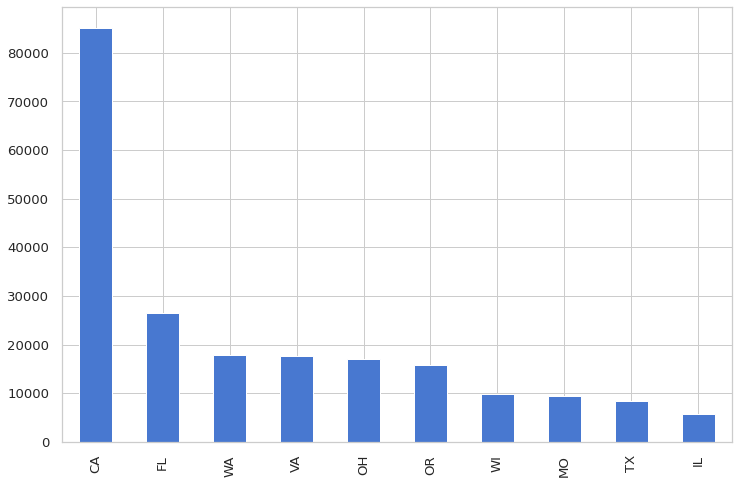

In [88]:
pulse_point_df.state.value_counts().head(10).sort_values(ascending=False).plot(kind = 'bar');

#### Duration

In [89]:
(pulse_point_df.groupby('state').sum()['duration_in_seconds'].sort_values(ascending=False) / 3600).head(5)

state
CA    52874.550000
FL    17708.350000
VA    13721.133333
WA    13311.633333
OH    13197.016667
Name: duration_in_seconds, dtype: float64

**California has over 43,000 hours of agency engagement whereas the second highest Florida has over 15,000 hours of engagement which is 3 times less**

### Occurrence Timeline

In [90]:
df_state_incident = pulse_point_df.groupby(["date_of_incident", 
                                      "state"],
                                     as_index=False).count()[['date_of_incident', 
                                     'state', 'title']].reset_index(drop=True).rename(columns={'date_of_incident':'date',
                                                                                               'title':'count'})

df_state_incident.columns = ['date', 'state', 'count']
df_state_incident

,date,state,count
0,2021-05-02,AK,1
1,2021-05-02,AZ,2
2,2021-05-02,CA,131
3,2021-05-02,CO,4
4,2021-05-02,DC,1
...,...,...,...
5434,2021-12-31,SD,29
5435,2021-12-31,UT,2
5436,2021-12-31,VA,417
5437,2021-12-31,WA,256


In [91]:
pipeline = pdp.PdPipeline([
    pdp.ApplyByCols('count', set_size, 'size', drop=False),
])

agg_incident_data = pipeline.apply(df_state_incident)

agg_incident_data.fillna(0, inplace=True)
agg_incident_data = agg_incident_data.sort_values(by='date', ascending=True)
agg_incident_data.date = agg_incident_data.date.dt.strftime('%Y-%m-%d') # convert  to string object
agg_incident_data.tail()

,date,state,count,size
5420,2021-12-31,AZ,19,2.995732
5419,2021-12-31,AK,39,3.688879
5437,2021-12-31,WA,256,5.549076
5427,2021-12-31,MN,26,3.295837
5438,2021-12-31,WI,81,4.406719


#### Animated geo scatter plot

In [92]:
fig = px.scatter_geo(
    agg_incident_data, locations="state", locationmode='USA-states',
    scope="usa",
    color="count", 
    size='size', hover_name="state", 
    range_color= [0, 2000], 
    projection="albers usa", animation_frame="date", 
    title='PulsePoint Incidents: Local Emergencies By State', 
    color_continuous_scale="portland"
    )

fig.show()

### US States Geolocation

#### Scrape States data

In [93]:
# https://developers.google.com/public-data/docs/canonical/states_csv

state_coordinate = pd.read_html("https://developers.google.com/public-data/docs/canonical/states_csv")[0]
state_coordinate

,state,latitude,longitude,name
0,AK,63.588753,-154.493062,Alaska
1,AL,32.318231,-86.902298,Alabama
2,AR,35.201050,-91.831833,Arkansas
3,AZ,34.048928,-111.093731,Arizona
4,CA,36.778261,-119.417932,California
5,CO,39.550051,-105.782067,Colorado
6,CT,41.603221,-73.087749,Connecticut
7,DC,38.905985,-77.033418,District of Columbia
8,DE,38.910832,-75.527670,Delaware
9,FL,27.664827,-81.515754,Florida


#### US States with Total Incident Count

In [94]:
pulse_point_state_df = pulse_point_df.groupby(['state']).count()[['title']].reset_index().rename(columns={'title':'count'})
pulse_point_state_df

,state,count
0,AK,1271
1,AL,58
2,AR,797
3,AZ,3642
4,BC,6
5,CA,85136
6,CO,1815
7,DC,1788
8,DE,2861
9,FL,26543


#### Missing US States

In [95]:
state_coordinate[~state_coordinate.state.isin(pulse_point_state_df.state)].reset_index(drop=True)

,state,latitude,longitude,name
0,CT,41.603221,-73.087749,Connecticut
1,MA,42.407211,-71.382437,Massachusetts
2,ME,45.253783,-69.445469,Maine
3,MS,32.354668,-89.398528,Mississippi
4,MT,46.879682,-110.362566,Montana
5,NH,43.193852,-71.572395,New Hampshire
6,PR,18.220833,-66.590149,Puerto Rico
7,RI,41.580095,-71.477429,Rhode Island
8,VT,44.558803,-72.577841,Vermont
9,WV,38.597626,-80.454903,West Virginia


#### Filter US States

In [96]:
pulse_point_state_df = pulse_point_state_df.merge(state_coordinate, on='state', how='left')
pulse_point_state_df

# there are three provinces of canada : 
# Manitoba : MB
# British Columbia : BC
# Ontario : ON

,state,count,latitude,longitude,name
0,AK,1271,63.588753,-154.493062,Alaska
1,AL,58,32.318231,-86.902298,Alabama
2,AR,797,35.201050,-91.831833,Arkansas
3,AZ,3642,34.048928,-111.093731,Arizona
4,BC,6,NaN,NaN,NaN
5,CA,85136,36.778261,-119.417932,California
6,CO,1815,39.550051,-105.782067,Colorado
7,DC,1788,38.905985,-77.033418,District of Columbia
8,DE,2861,38.910832,-75.527670,Delaware
9,FL,26543,27.664827,-81.515754,Florida


**Drop Canadian Provinces**

In [97]:
pulse_point_state_df.dropna(inplace=True)
pulse_point_state_df = pulse_point_state_df.reset_index(drop=True)

### Choropleth USA

In [98]:
url = (
    "https://raw.githubusercontent.com/python-visualization/folium/master/examples/data"
)

state_geo = f"{url}/us-states.json"
state_data = pulse_point_state_df.iloc[:,[0,1]]

m = folium.Map(location=[48, -102], zoom_start=4)

folium.Choropleth(
    geo_data=state_geo,
    name="choropleth",
    data=state_data,
    columns=["state", "count"],
    key_on="feature.id",
    fill_color="YlGn",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Number of Incidents",
).add_to(m)

folium.LayerControl().add_to(m)

m

#### With Count Marker

In [99]:
# icon credit : https://icon-icons.com/icon/location-sos-phone-call-help/68848
# https://www.clipartmax.com/middle/m2H7i8G6N4H7b1N4_metallic-icon-royalty-free-cliparts-icone-sos-png/

# custom icon : https://stackoverflow.com/a/68992396/11105356

for i in range(0, len(pulse_point_state_df)):
  folium.Marker(
    location = [pulse_point_state_df.iloc[i]['latitude'], pulse_point_state_df.iloc[i]['longitude']],
    popup = folium.Popup(f"{pulse_point_state_df.iloc[i]['name']}\n{pulse_point_state_df.iloc[i]['count']}", parse_html=True),
    icon=folium.features.CustomIcon('https://i.postimg.cc/JhmnMQXj/sos.png', icon_size=(24, 31))
  ).add_to(m)
m

### Choropleth USA Zoomed-IN

In [100]:
# https://plotly.com/python/choropleth-maps

fig = go.Figure(data=go.Choropleth(
    locations=pulse_point_state_df['state'], # Spatial coordinates
    z = pulse_point_state_df['count'].astype(float), # Data to be color-coded
    locationmode = 'USA-states', # set of locations match entries in `locations`
    colorscale = 'Reds',
    colorbar_title = "Total Occurrences",
))

fig.update_layout(
    title_text = 'US PulsePoint Emergencies Occurrences by State',
    geo_scope='usa', # limite map scope to USA
)

fig.show()

<a id='6.6'></a>
## 6.6 Incident Date & Time

### Date

#### Highest Number of Incidents

In [101]:
pulse_point_df.date_of_incident.value_counts().head(20)

2021-11-13    3918
2021-11-27    3765
2021-11-21    3481
2021-12-31    3422
2021-12-07    3273
2021-11-07    3164
2021-11-25    2963
2021-08-20    2947
2021-06-22    2931
2021-06-18    2890
2021-06-16    2865
2021-11-04    2862
2021-08-23    2850
2021-12-05    2832
2021-10-12    2755
2021-09-16    2692
2021-11-10    2656
2021-08-21    2560
2021-08-09    2547
2021-08-15    2529
Name: date_of_incident, dtype: int64

### Timeline

#### Daily

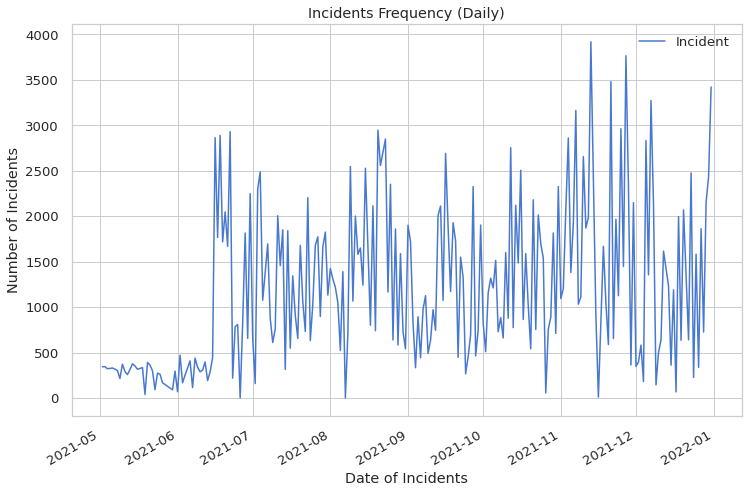

In [102]:
pulse_point_df.groupby(['date_of_incident']).count()['title'].reset_index().rename(columns={'date_of_incident':'Date',
                                                    'title':'count'}).sort_values('Date').plot(y='count',
                                                             x='Date',label="Incident")
plt.xlabel('Date of Incidents')
plt.ylabel('Number of Incidents')
plt.title("Incidents Frequency (Daily)")
plt.show();

**Number of PulsePoint dispatches increased after August, 2021**

#### Weekly

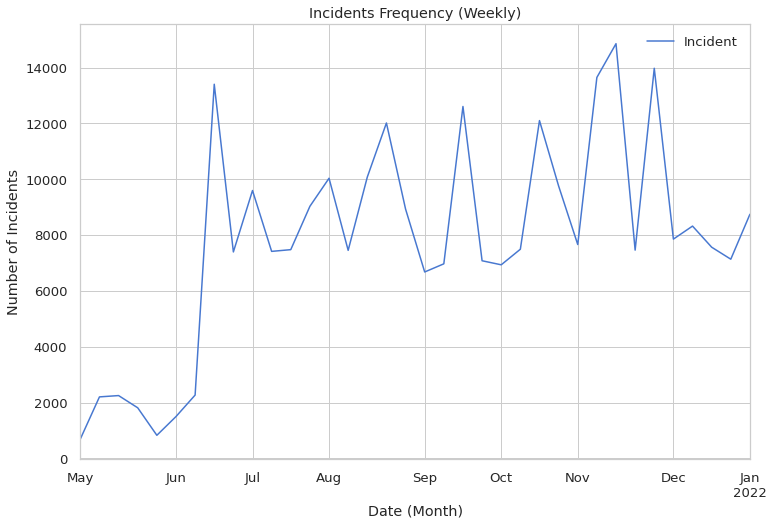

In [103]:
pulse_point_df.groupby([pd.Grouper(key='date_of_incident', 
                                   freq='W-MON')]).count()['title'].reset_index().rename(columns={'date_of_incident':'Date',
                                                    'title':'count'}).sort_values('Date').plot(y='count',
                                                             x='Date',label="Incident")
plt.xlabel('Date (Month)')
plt.ylabel('Number of Incidents')
plt.title("Incidents Frequency (Weekly)")
plt.show();

### Weekday Time

In [104]:
# pulse_point_df.groupby(['day_name','time_of_the_day'],as_index=False).count()

incident_time_df = pulse_point_df.groupby(["day_name", "time_of_the_day"],
                                     as_index=False).count()[['day_name', 
                                                              'time_of_the_day',
                                     'title']].reset_index(drop=True).rename(columns={'date_of_incident':'date',
                                                                                               'title':'incident_count'})
incident_time_df

,day_name,time_of_the_day,incident_count
0,Friday,Afternoon,4436
1,Friday,Evening,3278
2,Friday,Midnight,11565
3,Friday,Morning,15066
4,Friday,Night,4284
5,Monday,Afternoon,4806
6,Monday,Evening,4258
7,Monday,Midnight,10151
8,Monday,Morning,14196
9,Monday,Night,5633


,day_name,incident_count
3,Sunday,45983
4,Thursday,43424
6,Wednesday,39967
1,Monday,39044
0,Friday,38629
2,Saturday,37608
5,Tuesday,36623


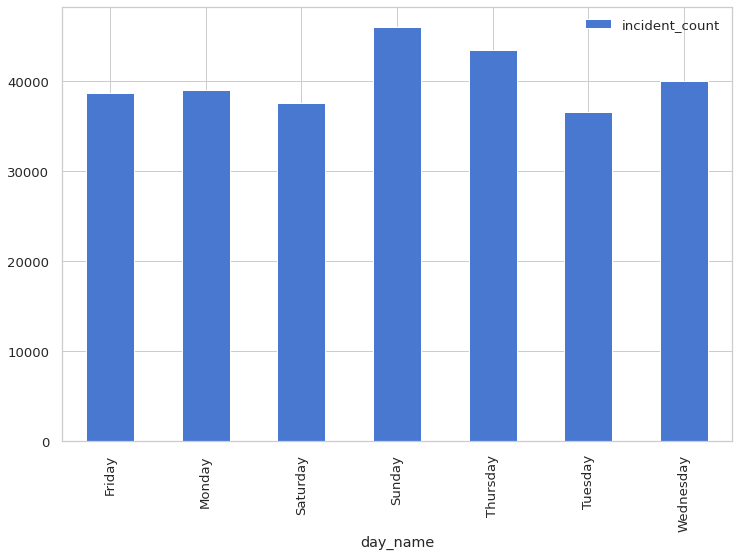

In [105]:
display(incident_time_df.groupby(['day_name']).sum().reset_index().sort_values(["incident_count"], ascending=False))

display(incident_time_df.groupby(['day_name']).sum().plot(kind='bar'))

**Highest number of incidents occurred on Sunday**  

#### Time of the Day

In [106]:
# incident_time_df.groupby(['day_name','time_of_the_day']).sum().plot(kind='bar', figsize=(25,8));

fig = px.bar(incident_time_df, 
        x="day_name", 
        y="incident_count", 
        color="time_of_the_day", 
        barmode="group",
        labels={'day_name':'Day', 
                'incident_count': 'Incident Count',
                'time_of_the_day': ''},
        title=f"Number of Incidents by Time of the Day",
        ).for_each_trace(lambda t: t.update(name=t.name.replace("=","")))

printmd("Emergency responses spiked at **midnight** or in the **morning**")
fig.show()


## alternative in seaborn catplot

# g=sns.catplot(data= incident_time_df, 
#               x="time_of_the_day", 
#               col='day_name',
#               y='incident_count', 
#               kind='bar', 
#               height=6,
#               col_wrap=4,
#                 )
# # bug : x-ticks not showing while using col_wrap
# # fixed : https://stackoverflow.com/a/52184614/11105356
# for ax in g.axes.flatten():
#     ax.tick_params(labelbottom=True)
# g.set_ylabels('Incident count')
# # for rotated x-ticks 
# # for ax in g.axes:
# #     plt.setp(ax.get_xticklabels(), visible=True, rotation=45)
# # plt.subplots_adjust(hspace=0.5)
# plt.show()

Emergency responses spiked at **midnight** or in the **morning**

**Most of the incidents occurred during Midnight or in the morning. Probably some of the incidents were already started at nighttime and were logged later in the morning.**

<a id='6.7'></a>
## 6.7 Major Incidents

In [107]:
pulse_point_df.groupby(['title']).count()[['agency']].rename(columns={'agency':'total'}).sort_values('total', ascending=False)[:25]

,total
title,
Medical Emergency,179753
Traffic Collision,22835
Fire Alarm,11147
Alarm,7420
Public Service,7363
Refuse/Garbage Fire,4437
Structure Fire,4152
Lift Assist,3130
Mutual Aid,2862


In [108]:
mask = (pulse_point_df.time_of_the_day == 'Midnight') | (pulse_point_df.time_of_the_day == 'Morning') 
highest_occ_incident = pulse_point_df[mask].groupby(['time_of_the_day','title']).count()[['agency']].rename(columns={'agency':'total'})

highest_occ_incident.sort_values('total', ascending=False)[:25]

total
time_of_the_day title                            
Morning         Medical Emergency           64587
Midnight        Medical Emergency           47640
Morning         Traffic Collision            8262
Midnight        Traffic Collision            7135
Morning         Fire Alarm                   3507
Midnight        Fire Alarm                   3112
Morning         Public Service               2725
                Alarm                        2437
Midnight        Alarm                        2067
                Public Service               2042
Morning         Refuse/Garbage Fire          1669
                Structure Fire               1566
                Fire                         1102
Midnight        Structure Fire               1064
Morning         Residential Fire             1027
                Lift Assist                   993
                Mutual Aid                    966
                Outside Fire                  936
Midnight        Refuse/Garbage Fire           858
Morning         Expanded Traffic Collision    840
Midnight        Mutual Aid                    772
Morning         Investigation                 735
Midnight        Expanded Traffic Collision    730
                Lift Assist                   721
                Residential Fire              697

Top ten emergencies during 'Midnight' or 'Morning' -

Midnight :

* Medical Emergency
* Traffic Collision
* Fire Alarm
* Alarm
* Public Service
* Structure Fire
* Refuse/Garbage Fire	
* Mutual Aid
* Residential Fire
* Expanded Traffic Collision

Morning :

* Medical Emergency
* Traffic Collision
* Fire Alarm
* Public Service
* Refuse/Garbage Fire
* Structure Fire
* Fire
* Residential Fire
* Mutual Aid
* Lift Assist



<a id='7'></a>
# 7 Clustering

<a id='7.1'></a>
## 7.1 Preprocess Dataset

In [109]:
pulse_point_df.isna().sum()

title                       0
agency                      0
location                    0
timestamp_time              0
date_of_incident            0
description             13384
duration                    0
business               266152
address                     0
address_2              272246
city                        0
state                       0
duration_in_seconds         0
day_name                    0
weekday                     0
month_name                  0
time_of_the_day             0
dtype: int64

### Filter Data

- "timestamp_time" was replaced with "time_of_the_day" feature
- "date_of_incident" was replaced with "week_day", "day_name" and "month_name"
- "business" and "address_2" has lots of null values, hence those features were removed
- "duration" was converted to numerical value and replaced with "duration_in_seconds"

In [110]:
pulse_point_cluster_df = pulse_point_df.drop([# 'location',
                                              'timestamp_time',
                                              'date_of_incident',
                                              # 'description',
                                              'duration',
                                              # 'address',
                                              'business', 
                                              'address_2', 
                                              ], axis=1)
pulse_point_cluster_df.dropna(inplace=True)
pulse_point_cluster_df.isna().sum()

title                  0
agency                 0
location               0
description            0
address                0
city                   0
state                  0
duration_in_seconds    0
day_name               0
weekday                0
month_name             0
time_of_the_day        0
dtype: int64

### Scaling

In [111]:
def scaling_df(df):
  X_cluster = df.copy()
  object_cols = df.columns[df.dtypes == object].to_list()
  label_enc=LabelEncoder()
  for i in object_cols:
      X_cluster[i]=X_cluster[[i]].apply(label_enc.fit_transform)
  
  scaler = MinMaxScaler()
  scaler.fit(X_cluster)
  X_cluster_scaled = pd.DataFrame(scaler.transform(X_cluster),columns= X_cluster.columns)
  return X_cluster_scaled

In [112]:
X_cluster = pulse_point_cluster_df.copy()
X_cluster_scaled = scaling_df(X_cluster)
X_cluster_scaled

,title,agency,location,description,address,city,state,duration_in_seconds,day_name,weekday,month_name,time_of_the_day
0,0.127907,0.854356,0.144585,0.294277,0.160584,0.855613,0.953488,0.043679,0.500000,1.0,0.571429,0.00
1,0.662791,0.875163,0.257272,0.367620,0.285639,0.871238,0.209302,0.004111,0.500000,1.0,0.571429,0.75
2,0.209302,0.875163,0.257622,0.971573,0.286045,0.871238,0.209302,0.020555,0.500000,1.0,0.571429,0.75
3,0.290698,0.872562,0.788836,0.524330,0.801920,0.869792,0.976744,0.009250,0.500000,1.0,0.571429,0.75
4,0.290698,0.872562,0.812933,0.521830,0.824166,0.869792,0.976744,0.007194,0.500000,1.0,0.571429,0.75
...,...,...,...,...,...,...,...,...,...,...,...,...
267889,0.662791,0.854356,0.047843,0.294371,0.053327,0.855613,0.953488,0.010791,0.166667,0.0,0.571429,0.50
267890,0.127907,0.854356,0.363169,0.294324,0.402886,0.855613,0.953488,0.008736,0.166667,0.0,0.571429,0.50
267891,0.662791,0.853056,0.324505,0.067862,0.360158,0.630208,0.697674,0.026208,0.500000,1.0,0.571429,1.00
267892,0.290698,0.872562,0.816313,0.519694,0.826735,0.869792,0.976744,0.004111,0.500000,1.0,0.571429,0.25


### PCA

In [113]:
def pulse_point_pca(X_data, n_components):
  pca = PCA(n_components=n_components)

  fit_pca = pca.fit(X_data)
 
  print("Variance Explained with {0} components ".format(n_components),
        round(sum(fit_pca.explained_variance_ratio_),2))

  return fit_pca, fit_pca.transform(X_data)

In [114]:
# for 12 components
pca_full, pulsepoint_data_full = pulse_point_pca(X_cluster_scaled, X_cluster_scaled.shape[1])

Variance Explained with 12 components  1.0


In [115]:
X_cluster_scaled.shape

(267894, 12)

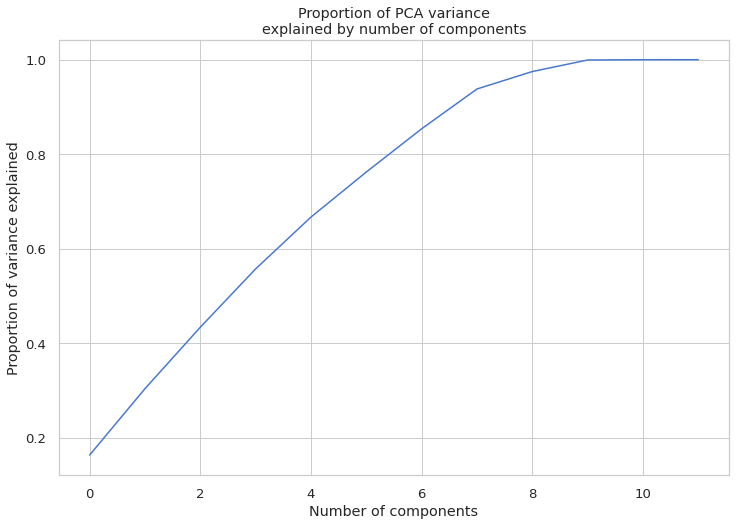

In [116]:
plt.plot(np.cumsum(pca_full.explained_variance_ratio_))
plt.title("Proportion of PCA variance\nexplained by number of components")
plt.xlabel("Number of components")
plt.ylabel("Proportion of variance explained");

We need about 7 components to explain ~90% of the variance in the data

<a id='7.2'></a>
## 7.2 Agency Engagement Vs Incident Duration by City

In [117]:
pulse_point_state_duration_df = pulse_point_cluster_df.groupby('city').agg({'agency':'count', 'duration_in_seconds': 'sum'}).reset_index()
pulse_point_state_duration_df.duration_in_seconds = pulse_point_state_duration_df.duration_in_seconds.apply(lambda x: x/3600)

pulse_point_state_duration_df.columns= ['city','total_agency_engagement', 'total_duration_hr']

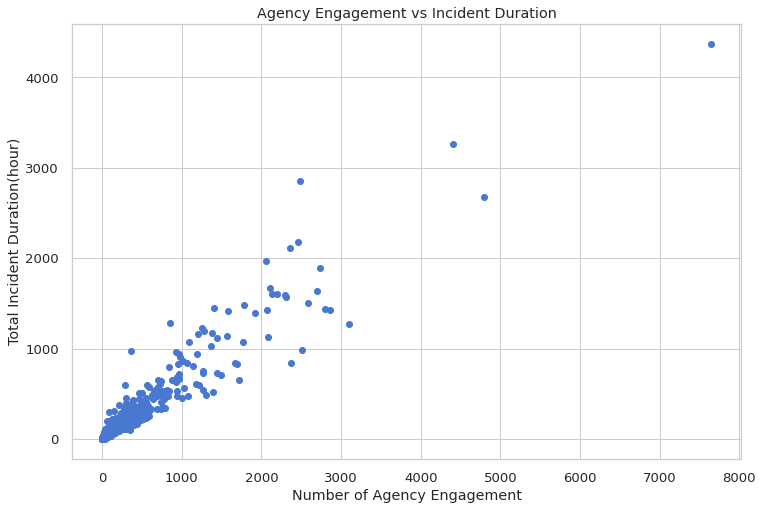

In [118]:
x = pulse_point_state_duration_df['total_agency_engagement'].values
y = pulse_point_state_duration_df['total_duration_hr'].values
plt.scatter(x,y)
plt.title('Agency Engagement vs Incident Duration')
plt.xlabel('Number of Agency Engagement')
plt.ylabel('Total Incident Duration(hour)')
plt.show()

The `agency_count` (number of agency engagement) and `duration_hr` (duration in hour) has a positive linear relationship.

**Higher Duration of Incidents indicates more agency engagement in a city**

### Clustering States By Duration


In [119]:
X = pulse_point_state_duration_df[['total_agency_engagement', 'total_duration_hr']].values

#### K-means Clustering

With “kmeans++” initialization the objective of this clustering is to create groups based on number of agency engagements and total incident duration (hour)

In [120]:
# To decide the optimum cluster number, KMeans++ using Elbow method
# to figure out K for KMeans, I will use ELBOW Method on KMEANS++ Calculation

wcss=[]

for i in range(1,11):
    kmeans = KMeans(n_clusters= i, init='k-means++', random_state=SEED)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)

    # inertia_ is the formula used to segregate the data points into clusters

**The best number of K lies between 2 and 4**

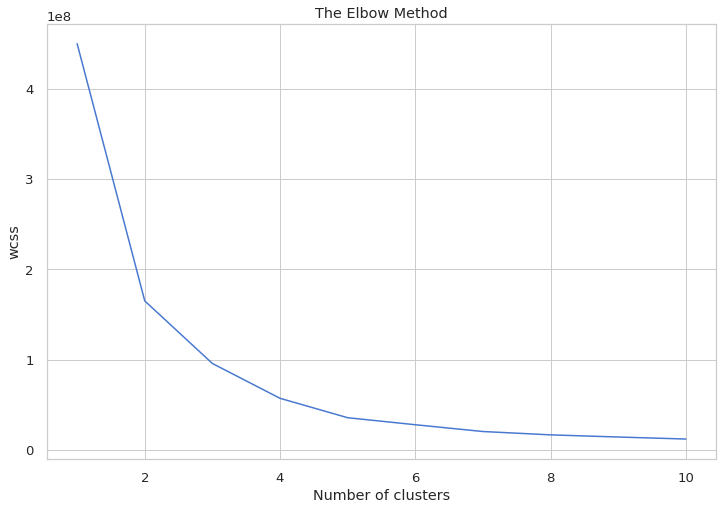

In [121]:
plt.plot(range(1,11), wcss)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('wcss')
plt.show()

In [122]:
kmeans = KMeans(n_clusters= 3, init='k-means++', random_state=SEED)
y_kmeans= kmeans.fit_predict(X)

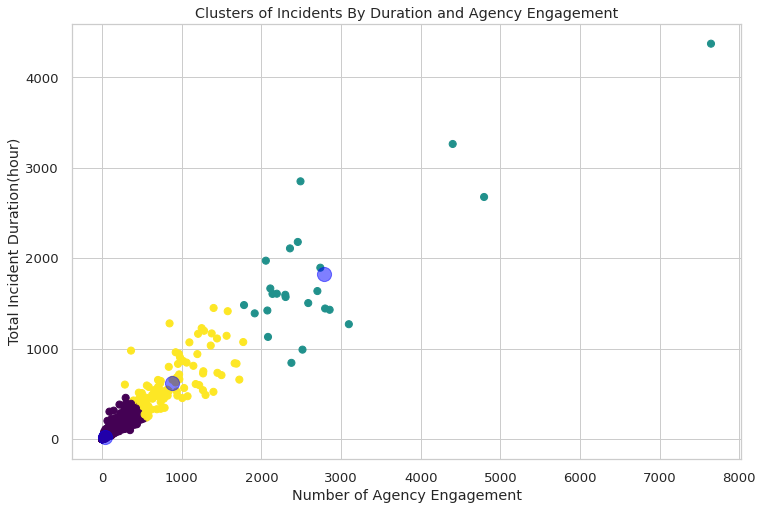

In [123]:
plt.scatter(X[:, 0], X[:, 1], c=y_kmeans, s=50, cmap='viridis')

centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='blue', s=200, alpha=0.5);

plt.title('Clusters of Incidents By Duration and Agency Engagement')
plt.xlabel('Number of Agency Engagement')
plt.ylabel('Total Incident Duration(hour)')
plt.show()



> The k-mean clustering algorithm clusters the **cities** based on *duration of incidents* and *number of agencies* into **three groups**. Small duration indicates having less number of agency engagement and vice-versa.

> **Group 1** : Cities with very low number of incidents duraion and agency engagements

> **Group 2** : Cities with comparatively higher number of incidents duraion and agency engagements

> **Group 2** : Cities with highest number of incidents duraion and agency engagements



#### Agglomerative Clustering

With “KElbowVisualizer” from yellowbrick library it’s found that optimum K value is 3 ( it implements the “elbow” method)

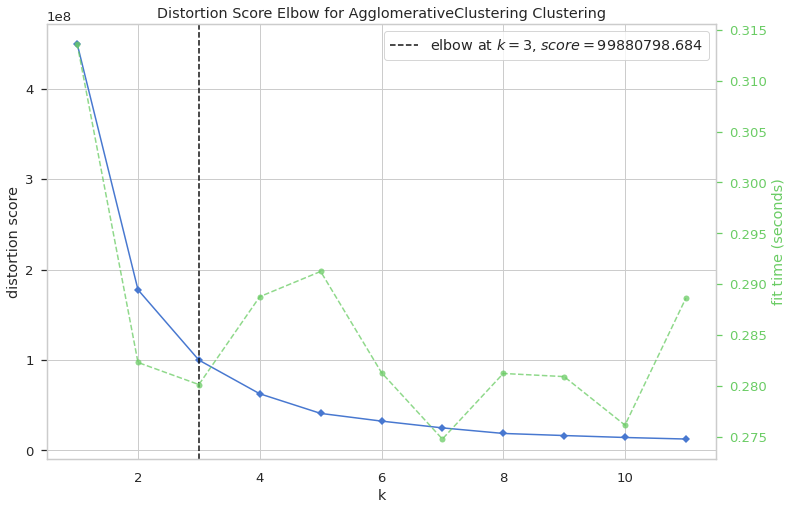

In [181]:
# Instantiate the clustering model and visualizer
model = AgglomerativeClustering()
visualizer = KElbowVisualizer(model, k=(1,12))

visualizer.fit(X)        # Fit the data to the visualizer
visualizer.show();

##### Ward Linkage

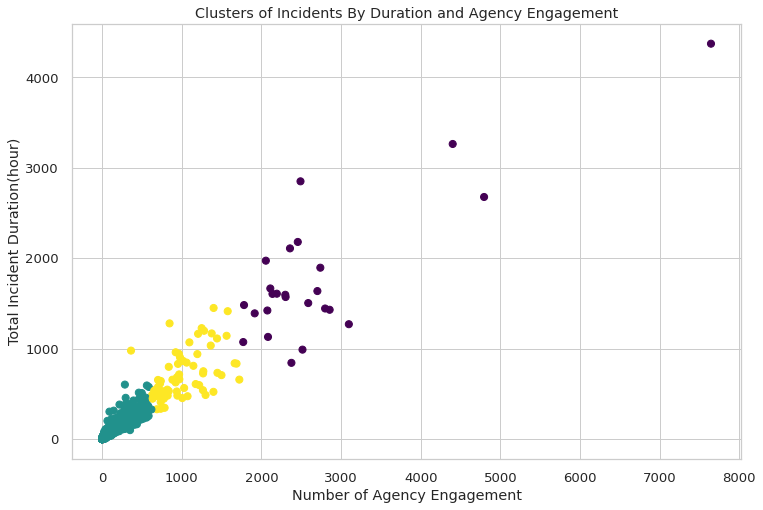

In [184]:
#Initiating the Agglomerative Clustering model 
AC = AgglomerativeClustering(n_clusters=3)
yhat_AC = AC.fit_predict(X)

plt.scatter(X[:, 0], X[:, 1], c=yhat_AC, s=50, cmap='viridis')
plt.title('Clusters of Incidents By Duration and Agency Engagement')
plt.xlabel('Number of Agency Engagement')
plt.ylabel('Total Incident Duration(hour)')
plt.show()

##### Complete Linkage

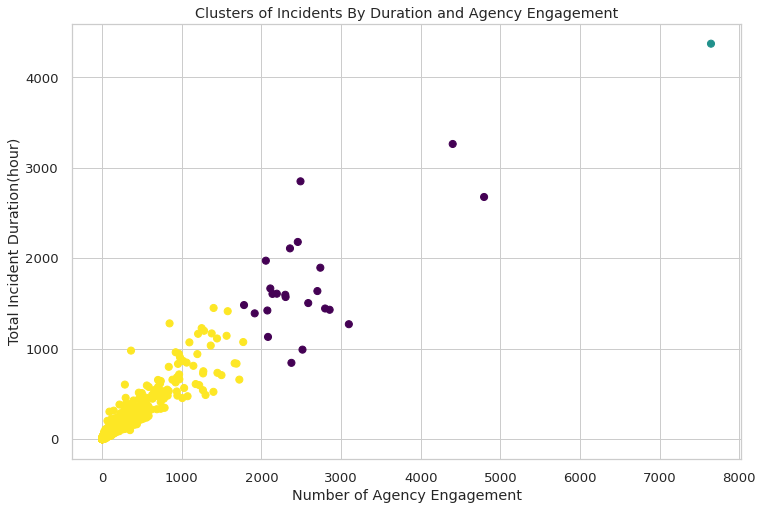

In [185]:
#Initiating the Agglomerative Clustering model 
AC = AgglomerativeClustering(n_clusters=3, linkage='complete')
yhat_AC = AC.fit_predict(X)

plt.scatter(X[:, 0], X[:, 1], c=yhat_AC, s=50, cmap='viridis')
plt.title('Clusters of Incidents By Duration and Agency Engagement')
plt.xlabel('Number of Agency Engagement')
plt.ylabel('Total Incident Duration(hour)')
plt.show()

#### Results
From the above clustering techniques, it is clear that “complete” linkage is not suitable for Agglomerative clustering (cluster parameter was given 3 but it mostly formed 2 clusters with 1-element cluster due to outlier). On the other hand, k-means and “Ward” Agglomerative provided a better clustering result. But the density of the cities is high when the value of number of agency engagement and total incident duration is low. 

K-means++ focused on clustering lower dense cities with unequal parameter distribution –

* Cluster 0: Total incident duration = ~400, number of engagements = ~500
*	Cluster 1: Total incident duration = 400 to ~1200, number of engagements = 500 to ~1500
*	Cluster 2: Total incident duration = 1200 to max, number of engagements = 1500 to max

The range of cluster 1 is bigger than cluster 0 in k-means whereas Ward Agglomerative did almost an equally distributed clustering for cluster 0 and 1. If the range of the parameters (engagements of duration) is important based on other factor, for example – budget allocation with respect to engagements or business decision/future planning based on duration of emergencies, then depending on the priority both clusters would be acceptable. 


<a id='8'></a>
# 8 Key Insights

* Most of the incidents occurred in California
* Most incidents happened during midnight and in the morning throughout the week
* Most of the emergency engagement lasted under 30 mins
* The highest number of incidents happened on Sunday
* The incidents’ number got increased after Covid-19 lockdown
* Medical emergency was the highest occurring incident which was followed by traffic collision and fire alarm
* Montgomery County, Milwaukee Fire, and Columbus Fire were the top active agencies during the five monthly period


<a id='9'></a>
# 9 Top 10 Incidents

In [127]:
top_incidents_list = pulse_point_df.title.value_counts().head(25).reset_index().rename(columns={'title':'total','index':'title'})
top_incidents_list

,title,total
0,Medical Emergency,179753
1,Traffic Collision,22835
2,Fire Alarm,11147
3,Alarm,7420
4,Public Service,7363
5,Refuse/Garbage Fire,4437
6,Structure Fire,4152
7,Lift Assist,3130
8,Mutual Aid,2862
9,Fire,2723


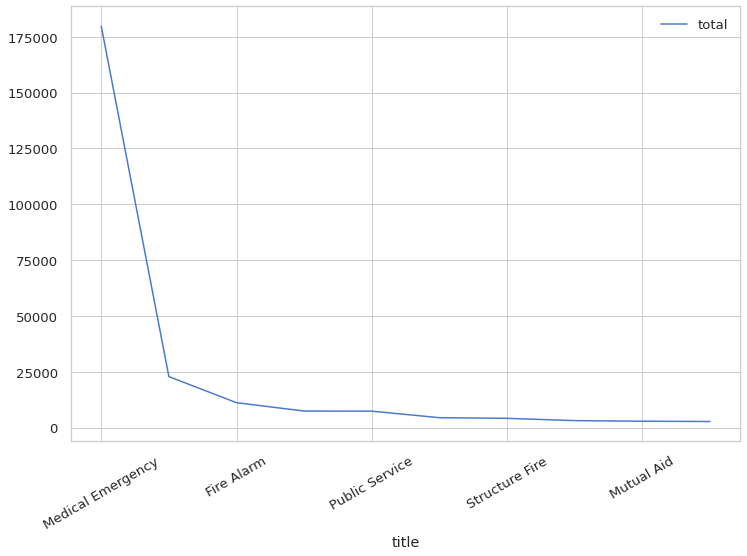

In [128]:
top_incidents_list[:10].plot(x='title', y='total', rot=30);

In [129]:
top_10_incidents = top_incidents_list.title.tolist()[:10]
top_10_incidents

['Medical Emergency',
 'Traffic Collision',
 'Fire Alarm',
 'Alarm',
 'Public Service',
 'Refuse/Garbage Fire',
 'Structure Fire',
 'Lift Assist',
 'Mutual Aid',
 'Fire']

In [130]:
pulse_point_top_10_df = pulse_point_df[pulse_point_df['title'].isin(top_10_incidents)].reset_index(drop=True)
pulse_point_top_10_df

,title,agency,location,timestamp_time,date_of_incident,description,duration,business,address,address_2,city,state,duration_in_seconds,day_name,weekday,month_name,time_of_the_day
0,Fire,Tacoma Fire,"2300 A ST, TACOMA, WA",11:52 AM,2021-05-02,NaN,1 h 46 m,None,2300 A ST,NaN,TACOMA,WA,6360,Sunday,6,May,Morning
1,Fire,Tacoma Fire,"PUYALLUP AVE & A ST, TACOMA, WA",9:37 AM,2021-05-02,E04,18 m,None,PUYALLUP AVE & A ST,NaN,TACOMA,WA,1080,Sunday,6,May,Morning
2,Fire,Tacoma Fire,"S 24TH ST & A ST, TACOMA, WA",9:00 AM,2021-05-02,E02,14 m,None,S 24TH ST & A ST,NaN,TACOMA,WA,840,Sunday,6,May,Morning
3,Mutual Aid,WPG Fire Paramedic,"DAKOTA ST & MEADOWOOD DR, WINNIPEG, MANITOBA",1:33 AM,2021-05-03,NaN,2 m,None,DAKOTA ST & MEADOWOOD DR,NaN,WINNIPEG,MB,120,Monday,0,May,Midnight
4,Fire,Winter Park Fire,"1000 EARLY AVE, WINTER PARK, FL",12:43 AM,2021-05-03,E61,20 m,None,1000 EARLY AVE,NaN,WINTER PARK,FL,1200,Monday,0,May,Midnight
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
245817,Structure Fire,Anoka County,"SOUTH COON CREEK DR NW & ROUND LAKE BLVD NW, ANDOVER, MN",6:22 AM,2021-05-02,AALL AE21,10 m,None,SOUTH COON CREEK DR NW & ROUND LAKE BLVD NW,NaN,ANDOVER,MN,600,Sunday,6,May,Morning
245818,Structure Fire,Anaheim FD,"710 E CERRITOS AV, ANAHEIM, CA (CRENSHAW LUMBER)",1:33 AM,2021-05-02,AB1 AB2 AE1 AE3 AE5 AE6 AE7 AI2 AT1 AT3 AT6 CE83 OB1 OE3,5 h 46 m,CRENSHAW LUMBER,710 E CERRITOS AV,NaN,ANAHEIM,CA,20760,Sunday,6,May,Midnight
245819,Mutual Aid,Sumter Fire & EMS,"34464 CORTEZ BLVD, BLDG NOT FOUND, RIDGE MANOR, FL (DOLLAR GENERAL)",3:45 AM,2021-05-03,NaN,9 m,DOLLAR GENERAL,34464 CORTEZ BLVD,BLDG NOT FOUND,RIDGE MANOR,FL,540,Monday,0,May,Midnight
245820,Fire,Tacoma Fire,"S 8TH ST & YAKIMA AVE, TACOMA, WA",7:38 PM,2021-05-02,E01,8 m,None,S 8TH ST & YAKIMA AVE,NaN,TACOMA,WA,480,Sunday,6,May,Evening


### Group By Day & Time

In [131]:
top_10_time_df = pulse_point_top_10_df.groupby(["title","day_name", "time_of_the_day"],
                                     as_index=False).count()[['title','day_name', 
                                                              'time_of_the_day',
                                     'agency']].reset_index(drop=True).rename(columns={'date_of_incident':'date',
                                                                                             'agency':'incident_count'})
top_10_time_df

,title,day_name,time_of_the_day,incident_count
0,Alarm,Friday,Afternoon,113
1,Alarm,Friday,Evening,114
2,Alarm,Friday,Midnight,355
3,Alarm,Friday,Morning,435
4,Alarm,Friday,Night,134
...,...,...,...,...
345,Traffic Collision,Wednesday,Afternoon,232
346,Traffic Collision,Wednesday,Evening,398
347,Traffic Collision,Wednesday,Midnight,851
348,Traffic Collision,Wednesday,Morning,990


### Utility Plot Function

In [132]:
# plotly categorical barplot
def plot_top_incident_by_time(title):
  fig = px.bar(top_10_time_df[top_10_time_df.title.str.strip()==title], 
        x="day_name", 
        y="incident_count", 
        color="time_of_the_day", 
        barmode="group",
        labels={'day_name':'Day', 
                'incident_count': 'Incident Count',
                'time_of_the_day': ''},
        title=f"{title} by Time of The Day",
        ).for_each_trace(lambda t: t.update(name=t.name.replace("=","")))
  # remove '=' sign from color
  # https://github.com/plotly/plotly_express/issues/36
  fig.show()


# seaborn alternative

# def plot_top_incident_by_time(title):
#   g=sns.catplot(data=top_10_time_df[top_10_time_df.title.str.strip()==title], 
#                 x="time_of_the_day",
#                 y='incident_count', 
#                 col='day_name',
#                 kind='bar', 
#                 height=6,
#                 col_wrap=4,)

#   for ax in g.axes.flatten():
#       ax.tick_params(labelbottom=True)

#   g.set_ylabels('Incident count')
#   g.set_axis_labels('Time of the Day')
#   g.set_titles("{col_name}")
#   # g.despine(left=True)
#   # plt.suptitle('Incident By Time')
#   plt.show()

## Medical Emergency

In [133]:
plot_top_incident_by_time('Medical Emergency')

## Traffic Collision

In [134]:
plot_top_incident_by_time('Traffic Collision')

## Fire Alarm

In [135]:
plot_top_incident_by_time('Fire Alarm')

## Alarm

In [136]:
plot_top_incident_by_time('Alarm')

## Public Service

In [137]:
plot_top_incident_by_time('Public Service')

## Refuse/Garbage Fire

In [138]:
plot_top_incident_by_time('Refuse/Garbage Fire')

## Structure Fire

In [139]:
plot_top_incident_by_time('Structure Fire')

## Mutual Aid

In [140]:
plot_top_incident_by_time('Mutual Aid')

## Lift Assist

In [141]:
plot_top_incident_by_time('Lift Assist')

## Fire

In [142]:
plot_top_incident_by_time('Fire')

<a id='10'></a>
# 10 Top State : CA 

According to a 2017 study from the U.S. Census Bureau, California state's local governments consist of 57 counties, 482 cities, towns, and villages, and 2,894 special districts

In [143]:
pulse_point_ca_df = pulse_point_df[pulse_point_df.state.str.strip() == 'CA'].copy()
pulse_point_ca_df.drop(axis=1, columns=['state'],inplace=True)
pulse_point_ca_df.head()

,title,agency,location,timestamp_time,date_of_incident,description,duration,business,address,address_2,city,duration_in_seconds,day_name,weekday,month_name,time_of_the_day
11,Structure Fire,Woodland Fire,"2220 MURPHY DR, WOODLAND, CA",11:00 PM,2021-05-02,BAT1 BAT31 E1 E2 E3 E32 E7 T3,41 m,None,2220 MURPHY DR,NaN,WOODLAND,2460,Sunday,6,May,Night
20,Fire,Colton Fire,"EB 10 MT VERNON > I 215, COLTON, CA",12:57 AM,2021-05-03,MT211,22 m,None,EB 10 MT VERNON > I 215,NaN,COLTON,1320,Monday,0,May,Midnight
21,Working Residential Fire,Contra Costa FPD,"30 GUZMAN CT, CONCORD, CA",12:25 AM,2021-05-03,BC1 BC2 BS107 DISP E105 E109 E110 E122 E1665 INV80 M9 PD PGE2 T101 TC10 TIMER,2 h 55 m,None,30 GUZMAN CT,NaN,CONCORD,10500,Monday,0,May,Midnight
25,Refuse/Garbage Fire,Compton Fire,"710 - LONG BEACH FRWY & W ALONDRA BLVD, COMPTON, CA",11:34 AM,2021-05-02,42,32 m,None,710 - LONG BEACH FRWY & W ALONDRA BLVD,NaN,COMPTON,1920,Sunday,6,May,Morning
35,Residential Fire,Alameda Co FD,"32242 MERCURY WAY, UNION CITY, CA",1:12 AM,2021-05-12,B07 E27 E32 E33 R24 T31 TAC03,23 m,None,32242 MERCURY WAY,NaN,UNION CITY,1380,Wednesday,2,May,Midnight


<a id='10.1'></a>
## 10.1 Descriptive Analysis

In [144]:
pulse_point_ca_df.describe().T

,count,mean,std,min,25%,50%,75%,max
duration_in_seconds,85136.0,2235.815401,2495.429214,0.0,960.0,1500.0,2940.0,94080.0
weekday,85136.0,3.157278,2.070344,0.0,1.0,3.0,5.0,6.0


**The average duration of the incidents is ~37 minutes**

In [145]:
pulse_point_ca_df.describe(include='object').T

,count,unique,top,freq
title,85136,81,Medical Emergency,52612
agency,85136,190,Contra Costa FPD,4609
location,85136,54278,"N HARBOR BL, FULLERTON, CA",79
timestamp_time,85136,1440,6:42 AM,113
description,83417,22841,E51,439
duration,85136,469,19 m,2528
business,3264,2633,UNINC,83
address,85136,50046,EL CAMINO REAL,112
address_2,2791,1197,GIL,168
city,85136,774,LOS ANGELES,8017


#### CA State Summary

1. **Contra Costa FPD** is the most engaged agency
2. Highest reported incidents occurred on Sunday
3. After the end of covid-19 lockdown, the number of emergency incidents was higher and peaked at last month - November
4. Most reported emergencies have taken place in Los Angeles
5. Fire Truck Engine 51 (E51) was the most frequent emergency code 

In [146]:
pulse_point_ca_df.description.value_counts().head(20)

E51        439
E57        355
E53        307
E3         270
E58        269
E56        261
E1         254
E55        254
E52        247
FA1 FE1    243
E60        238
E13        233
E14        232
E54        232
E18        229
E11        225
E10        225
E7         217
E33        214
E2         211
Name: description, dtype: int64

Top emergency code descriptions refer to **Fire Emergency** -

* [E51 Fire Engine](https://en.wikipedia.org/wiki/Engine_51)
* [E57 responding to a emergency](https://youtu.be/KHLXfla934E)
* Here is an E53 Fire Truck - 
![E53 Fire Truck](https://live.staticflickr.com/684/32220280980_a36919d676_b.jpg "Credit: flickr")

In [147]:
printmd(f"There are total **{len(pulse_point_ca_df.city.unique())}** cities in California")

There are total **774** cities in California

In [148]:
pulse_point_ca_df.day_name.value_counts().head(10)
printmd(f"**Most emergencies take place in Saturday and Sunday (Holiday) in California**")

**Most emergencies take place in Saturday and Sunday (Holiday) in California**

### Incidents by Time of The Day

In [149]:
pulse_point_ca_df.time_of_the_day.value_counts()

Morning      32291
Midnight     22433
Afternoon    11710
Night        11128
Evening       7574
Name: time_of_the_day, dtype: int64

### Major Incidents

In [150]:
pulse_point_ca_df.title.value_counts().head(20)

Medical Emergency             52612
Traffic Collision              7065
Refuse/Garbage Fire            3418
Alarm                          2908
Fire Alarm                     2519
Public Service                 2076
Structure Fire                 1216
Fire                           1037
Investigation                   889
Outside Fire                    871
Expanded Traffic Collision      826
Vehicle Fire                    645
Wires Down                      569
Commercial Fire                 501
Interfacility Transfer          485
Lift Assist                     448
Waterflow Alarm                 444
Residential Fire                439
Emergency Response              414
Vegetation Fire                 408
Name: title, dtype: int64

**Apart from medical emergency, top incidents of California includes fire, alarm and traffic collision** 

California is susceptible to an impressive array of natural hazards, including earthquakes, fires, flooding and mudslides.

Here is a good article on this - 

[4 REASONS CALIFORNIA IS MORE SUSCEPTIBLE TO NATURAL DISASTERS THAN OTHER STATES](https://www.snapnhd.com/blog/4-reasons-california-is-more-susceptible-to-natural-disasters-than-other-states)

### Major Cities

In [151]:
pulse_point_ca_df.city.value_counts().head(20)

LOS ANGELES      8017
FREMONT          2611
LONG BEACH       2587
FULLERTON        2138
COMPTON          1705
SANTA ANA        1683
SANTA CLARITA    1452
LANCASTER        1413
MILPITAS         1403
WOODLAND         1377
POMONA           1266
ONTARIO          1230
OCEANSIDE        1227
IRVINE           1175
PALMDALE         1074
CONCORD           970
GARDEN GROVE      942
ANTIOCH           937
GLENDALE          821
INGLEWOOD         784
Name: city, dtype: int64

**Map Geolocation**

In [152]:
mask = (pulse_point_city_df.city.isin(pulse_point_ca_df.city.unique().tolist())) & (pulse_point_city_df.state == 'CA')

ca_city = pulse_point_city_df[mask].reset_index(drop=True)
ca_city

,city,state,count,location,longitude,latitude
0,**UNDEFINED,CA,17,"**UNDEFINED, CA, USA",38.123901,55.986527
1,29 PALMS,CA,9,"29 PALMS, CA, USA",-116.054351,34.135692
2,ACTON,CA,37,"ACTON, CA, USA",-118.186838,34.480741
3,ADELANTO,CA,20,"ADELANTO, CA, USA",-117.409215,34.582770
4,AGOURA,CA,23,"AGOURA, CA, USA",-118.738129,34.143161
...,...,...,...,...,...,...
768,YOLO,CA,184,"YOLO, CA, USA",-121.905900,38.718454
769,YORBA LINDA,CA,320,"YORBA LINDA, CA, USA",-117.824971,33.890110
770,YUCCA VALLEY,CA,11,"YUCCA VALLEY, CA, USA",-116.413984,34.123621
771,ZAMORA,CA,63,"ZAMORA, CA, USA",-121.881912,38.796568


### Incidents Distribution 

In [153]:
ca_city['count'].describe()

count     773.000000
mean      110.133247
std       382.835327
min         1.000000
25%         3.000000
50%         9.000000
75%        73.000000
max      8017.000000
Name: count, dtype: float64

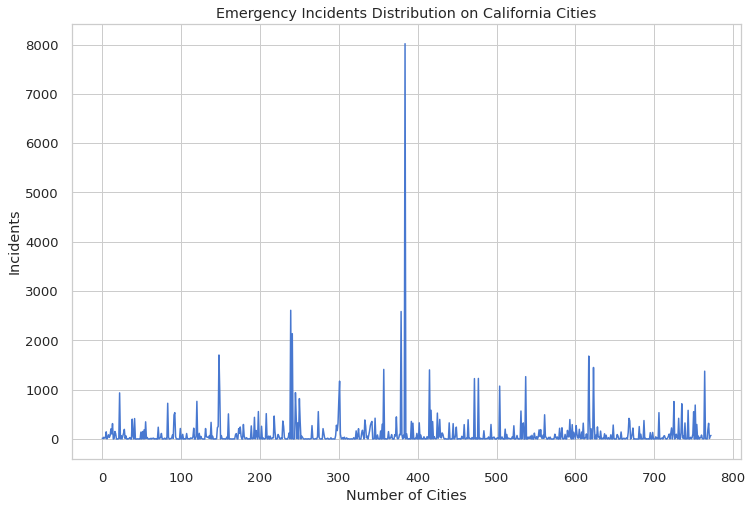

In [154]:
ca_city['count'].plot(title='Emergency Incidents Distribution on California Cities');
plt.xlabel('Number of Cities')
plt.ylabel('Incidents')
plt.show()

<a id='10.2'></a>
## 10.2 Geoplot

### Color Code Cities (By Number of Inidents)

In [155]:
ca_city['color']=ca_city['count'].apply(lambda count:"Black" if count>=1500 else
                                         "green" if count>=1200 and count<1500 else
                                         "Orange" if count>=800 and count<1200 else
                                         "darkblue" if count>=500 and count<800 else
                                         "red" if count>=300 and count<500 else
                                         "lightblue" if count>=100 and count<300 else
                                         "brown" if count>=10 and count<100 else
                                         "violet" if count>=5 and count<10 else
                                         "grey")
ca_city['size']=ca_city['count'].apply(lambda count:10 if count>=1500 else
                                         8 if count>=1200 and count<1500 else
                                         7 if count>=800 and count<1200 else
                                         6 if count>=500 and count<800 else
                                         5 if count>=300 and count<500 else
                                         4 if count>=100 and count<300 else
                                         3 if count>=10 and count<100 else
                                         2 if count>=5 and count<10 else
                                         1)

In [156]:
geometry2 = geopandas.points_from_xy(ca_city.longitude, ca_city.latitude)
geo_df2 = geopandas.GeoDataFrame(ca_city[['city','count','longitude', 'latitude']], geometry=geometry2)

geo_df2.head()

,city,count,longitude,latitude,geometry
0,**UNDEFINED,17,38.123901,55.986527,POINT (38.12390 55.98653)
1,29 PALMS,9,-116.054351,34.135692,POINT (-116.05435 34.13569)
2,ACTON,37,-118.186838,34.480741,POINT (-118.18684 34.48074)
3,ADELANTO,20,-117.409215,34.582770,POINT (-117.40922 34.58277)
4,AGOURA,23,-118.738129,34.143161,POINT (-118.73813 34.14316)


In [157]:
geoJSON_df = geopandas.read_file(state_geo)
geoJSON_CA = geoJSON_df.loc[geoJSON_df.id == 'CA']
geoJSON_CA

,id,name,geometry
4,CA,California,"POLYGON ((-123.23326 42.00619, -122.37885 42.01166, -121.03700 41.99523, -120.00186 41.99523, -119.99638 40.26452, -120.00186 38.99935, -118.71478 38.10113, -117.49890 37.21934, -116.54044 36.50186, -115.85034 35.97060, -114.63446 35.00118, -114.63446 34.87521, -114.47015 34.71090, -114.33323 34.44801, -114.13606 34.30561, -114.25655 34.17416, -114.41538 34.10844, -114.53587 33.93318, -114.49754 33.69767, -114.52492 33.54979, -114.72757 33.40739, -114.66184 33.03496, -114.52492 33.02948, -114.47015 32.84327, -114.52492 32.75563, -114.72209 32.71730, -116.04751 32.62419, -117.12647 32.53656, -117.24696 32.66800, -117.25244 32.87613, -117.32911 33.12259, -117.47151 33.29785, -117.78370 33.53884, -118.18352 33.76339, -118.26019 33.70314, -118.41355 33.74148, -118.39164 33.84007, -118.56690 34.04272, -118.80241 33.99890, -119.21866 34.14678, -119.27890 34.26727, -119.55823 34.41515, -119.87589 34.40967, -120.13878 34.47539, -120.47288 34.44801, -120.64814 34.57946, -120.60980 34.85878, -120.67005 34.90259, -120.63171 35.09976, -120.89460 35.24764, -120.90556 35.45029, -121.00414 35.46124, -121.16845 35.63650, -121.28347 35.67484, -121.33276 35.78438, -121.71614 36.19515, -121.89688 36.31565, -121.93522 36.63878, -121.85854 36.61140, -121.78734 36.80309, -121.92974 36.97836, -122.10501 36.95645, -122.33504 37.11528, -122.41719 37.24125, -122.40076 37.36174, -122.51578 37.52057, -122.51578 37.78346, -122.32956 37.78346, -122.40624 38.15042, -122.48839 38.11208, -122.50482 37.93134, -122.70199 37.89300, -122.93750 38.02993, -122.97584 38.26544, -123.12919 38.45165, -123.33184 38.56667, -123.44138 38.69811, -123.73713 38.95553, -123.68784 39.03221, -123.82476 39.36630, -123.76452 39.55252, -123.85215 39.83184, -124.10957 40.10569, -124.36151 40.25904, -124.41080 40.43978, -124.15886 40.87794, -124.10957 41.02581, -124.15886 41.14083, -124.06575 41.44206, -124.14790 41.71591, -124.25744 41.78163, -124.21363 42.00071, -123.23326 42.00619))"


In [158]:
map_CA = folium.Map(location = [38, -115], zoom_start = 6)

# https://stackoverflow.com/a/61129097/11105356
folium.GeoJson(geoJSON_CA.geometry,
               name='California').add_to(map_CA)


for lat,lon,area,color,count,size in zip(ca_city['latitude'],ca_city['longitude'],ca_city['city'],ca_city['color'],ca_city['count'],ca_city['size']):
     folium.CircleMarker([lat, lon],
                            popup=folium.Popup(f"{area}, {count}", parse_html=True),
                            radius=size*5,
                            color='b',
                            fill=True,
                            fill_opacity=0.7,
                            fill_color=color,
                           ).add_to(map_CA)
map_CA

### With Heatmap

In [159]:
heat_data = [[point.xy[1][0], point.xy[0][0]] for point in geo_df2.geometry ]

# # heat_data
HeatMap(heat_data).add_to(map_CA)

map_CA

### With Marker

In [160]:
map_CA_c = folium.Map(location = [38, -115], zoom_start = 6)

# https://stackoverflow.com/a/61129097/11105356
folium.GeoJson(geoJSON_CA.geometry,
               name='California').add_to(map_CA_c)

for i in range(0, len(ca_city)):
  folium.Marker(
    location = [ca_city.iloc[i]['latitude'], ca_city.iloc[i]['longitude']],
    popup = folium.Popup(f"{ca_city.iloc[i]['city']}\n{ca_city.iloc[i]['count']}", parse_html=True),
    icon=folium.features.CustomIcon('https://i.postimg.cc/JhmnMQXj/sos.png', icon_size=(24, 31))
  ).add_to(map_CA_c)

# # heat_data
HeatMap(heat_data).add_to(map_CA_c)

map_CA_c

<a id='10.3'></a>
## 10.3 Insights

1. Southern and central California are two most active region
2. Most of the incidents have taken place in Los Angelos and San Francisco, both are highly active city (PulsePoint is based in the San Francisco Bay Area)

<a id='11'></a>
# 11 Conclusions

## Future Work

- Dataset still has some outliers in location related features. This issue will be resolved in the future version
- I performed clustering on incident duration and agency engagement grouped by cities. So, different groups of data could be explored for clustering as well as other clustering techniques 
- Better result could be achieved by performing dimensionality reduction for clustering or hyperparameter tuning
- Detailed time series & geospatial analysis on the dataset
- The impact of/correlations with the lockdown and other Covid-19-driven policy actions/agency activities in different states in 2020
- Detailed investigation on the possible correlation/inference with the incidents and local infrastructure


## End Notes

- **Demographic data** would be valuabe to do research on users to find more insights and their association with emergencies
- A glossary / clear explanation of all emegercy codes (description) would be valuable to sort out incidents
- Research work on PulsePoint can be found here - [https://www.pulsepoint.org/research-studies](https://www.pulsepoint.org/research-studies)


<a id='12'></a>
# 12 References

1. [PulsePoint Wikipedia](https://en.wikipedia.org/wiki/PulsePoint)
2. [Provinces and territories of Canada](https://en.wikipedia.org/wiki/Provinces_and_territories_of_Canada)
3. [Google Public Dataset-US states](https://developers.google.com/public-data/docs/canonical/states_csv)
4. [US States GeoJSON](https://github.com/python-visualization/folium/blob/main/examples/data/us-states.json)